In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install openpyxl

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 250.9/250.9 kB 4.1 MB/s eta 0:00:00


In [3]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_squared_error
from sklearn.decomposition import PCA
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

In [4]:
import pandas as pd

# Charger le fichier Excel
data = pd.read_excel('/content/drive/MyDrive/pCO2_Dataset.xlsx')
data.head()

,DATE,LAT,LON,pCO2w,SST,SSS,Chla,aCDOM
0,19970916,49.180000,-133.47000,317.15253,16.15,32.495998,-0.442036,-1.631763
1,19970916,49.009998,-131.14999,312.06076,17.08,32.487000,-0.563070,-1.806464
2,19970916,48.990002,-130.97000,321.26727,17.16,32.333000,-0.558054,-1.751414
3,19970916,43.342999,-126.50000,323.05075,18.15,31.799999,-0.274361,-1.571059
4,19970920,43.000000,-126.61000,332.33185,18.50,31.860001,-0.570405,-1.637942


In [5]:
# Afficher le nombre de valeurs manquantes (NaN) dans chaque colonne
nan_count = data.isna().sum()
print(nan_count)

DATE         0
LAT          0
LON          0
pCO2w      198
SST        198
SSS      47052
Chla         0
aCDOM    64350
dtype: int64


# Imputation avec Random Forest :

In [6]:
# Supprimer uniquement les lignes contenant des valeurs manquantes
data = data.dropna(axis=0, how='any')

In [7]:
# Supprimer les colonnes 'DATE', 'LAT' et 'LON'
data = data.drop(columns=['DATE', 'LAT', 'LON'])

In [8]:
data.head()

,pCO2w,SST,SSS,Chla,aCDOM
0,317.15253,16.15,32.495998,-0.442036,-1.631763
1,312.06076,17.08,32.487000,-0.563070,-1.806464
2,321.26727,17.16,32.333000,-0.558054,-1.751414
3,323.05075,18.15,31.799999,-0.274361,-1.571059
4,332.33185,18.50,31.860001,-0.570405,-1.637942


In [9]:
data.shape

(412047, 5)

In [10]:
# Afficher le nombre de valeurs manquantes (NaN) dans chaque colonne
nan_count = data.isna().sum()
print(nan_count)

pCO2w    0
SST      0
SSS      0
Chla     0
aCDOM    0
dtype: int64


In [11]:
# Compter le nombre de valeurs manquantes dans chaque colonne
missing_values_count = data.isnull().sum()

# Afficher le nombre de valeurs manquantes pour chaque colonne
print("Nombre de valeurs manquantes par colonne :")
print(missing_values_count)

# Compter le nombre total de valeurs manquantes dans le dataset
total_missing = missing_values_count.sum()
print(f"\nNombre total de valeurs manquantes dans le dataset : {total_missing}")

Nombre de valeurs manquantes par colonne :
pCO2w    0
SST      0
SSS      0
Chla     0
aCDOM    0
dtype: int64

Nombre total de valeurs manquantes dans le dataset : 0


In [12]:
# prompt: ecrire moi le code pour normaliser mes donnees

from sklearn.preprocessing import MinMaxScaler

# Sélectionner les colonnes numériques à normaliser
numerical_cols = data.select_dtypes(include=np.number).columns

# Créer un scaler MinMaxScaler
scaler = MinMaxScaler()

# Normaliser les colonnes numériques
data[numerical_cols] = scaler.fit_transform(data[numerical_cols])

# Afficher les premières lignes du DataFrame normalisé
print(data.head())

      pCO2w       SST       SSS     Chla      aCDOM
0  0.223254  0.518738  0.803453  0.290793  0.312133
1  0.219383  0.546138  0.803230  0.270270  0.248846
2  0.226383  0.548494  0.799410  0.271120  0.268789
3  0.227739  0.577662  0.786189  0.319224  0.334124
4  0.234795  0.587974  0.787677  0.269026  0.309895


In [13]:
# 1. Échantillonnage aléatoire de 10% des données
sampled_data = data.sample(frac=0.10, random_state=123)

In [14]:
sampled_data.head()

,pCO2w,SST,SSS,Chla,aCDOM
341522,0.162485,0.131018,0.151950,0.528990,0.643608
64152,0.394769,0.766808,0.851225,0.334685,0.372136
168822,0.277936,0.431530,0.179730,0.535649,0.635654
59999,0.209314,0.629220,0.187667,0.490225,0.656188
8461,0.243707,0.562076,0.896815,0.170311,0.202131


In [15]:
np.shape(data)

(412047, 5)

In [16]:
# 2. Imputation avec RandomForest
#rf_regressor = RandomForestRegressor(n_estimators=100, max_features="sqrt", max_depth=10, random_state=123)
rf_regressor = RandomForestRegressor(n_estimators=150, max_features="sqrt", max_depth= 150, random_state=123)
rf_imputer = IterativeImputer(estimator=rf_regressor, max_iter=10, random_state=123)

In [17]:
# Appliquer l'imputation
data_imputed = rf_imputer.fit_transform(sampled_data)
print("Imputation avec RandomForest effectuée avec succès.")

Imputation avec RandomForest effectuée avec succès.


In [18]:
# Validation de l'imputation
# Introduire artificiellement des valeurs manquantes (10% des valeurs) uniquement dans les colonnes "SSS" et "aCDOM"
sampled_data_missing = sampled_data.copy()
np.random.seed(123)

# Création d'un masque pour seulement les colonnes "SSS" et "aCDOM"
missing_mask = np.random.rand(*sampled_data[["SSS", "aCDOM"]].shape) < 0.1

# Application du masque sur les colonnes "SSS" et "aCDOM"
sampled_data_missing.loc[:, ["SSS", "aCDOM"]] = sampled_data_missing[["SSS", "aCDOM"]].mask(missing_mask)

In [19]:
# Imputer les valeurs manquantes introduites artificiellement
imputed_data_with_missing = rf_imputer.transform(sampled_data_missing)

In [20]:
# Vérifier qu'il n'y a pas de NaN dans les données imputées
if np.isnan(imputed_data_with_missing).any():
    print("Il reste des valeurs manquantes après l'imputation.")
else:
    # Extraction des valeurs originales et imputées pour les colonnes "SSS" et "aCDOM" avec le masque
    # Utilisez .iloc pour les DataFrames et indexation directe si numpy.ndarray
    original_values = sampled_data[["SSS", "aCDOM"]].values[missing_mask]
    imputed_values = imputed_data_with_missing[:, [sampled_data.columns.get_loc("SSS"), sampled_data.columns.get_loc("aCDOM")]][missing_mask]

    # Vérification finale si les données contiennent encore des NaN
    if not (np.isnan(original_values).any() or np.isnan(imputed_values).any()):
        mse = mean_squared_error(original_values, imputed_values)
        rmse = np.sqrt(mse)
        print(f"MSE entre les valeurs originales et imputées : {mse}")
        print(f"RMSE entre les valeurs originales et imputées : {rmse}")
    else:
        print("Erreur : certaines valeurs restent manquantes dans les données utilisées pour le calcul de l'erreur.")

MSE entre les valeurs originales et imputées : 0.002073940768422388
RMSE entre les valeurs originales et imputées : 0.045540539834551676


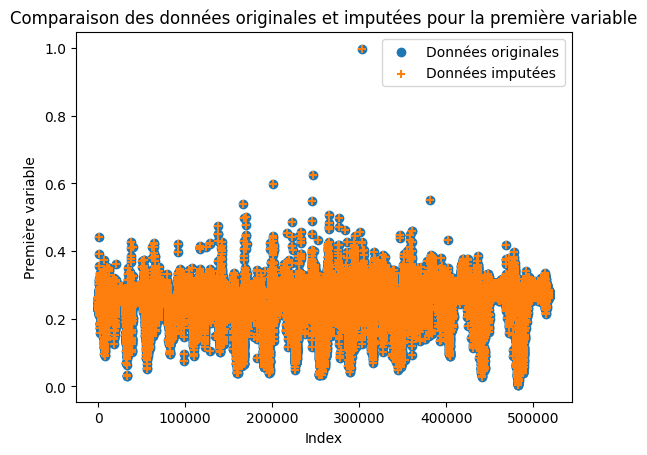

In [21]:

# Visualisation d'une partie des données imputées pour comparer
plt.scatter(sampled_data.index, sampled_data.values[:, 0], label='Données originales')
plt.scatter(sampled_data_missing.index, imputed_data_with_missing[:, 0], label='Données imputées', marker='+')
plt.xlabel("Index")
plt.ylabel("Première variable")
plt.title("Comparaison des données originales et imputées pour la première variable")
plt.legend()
plt.show()

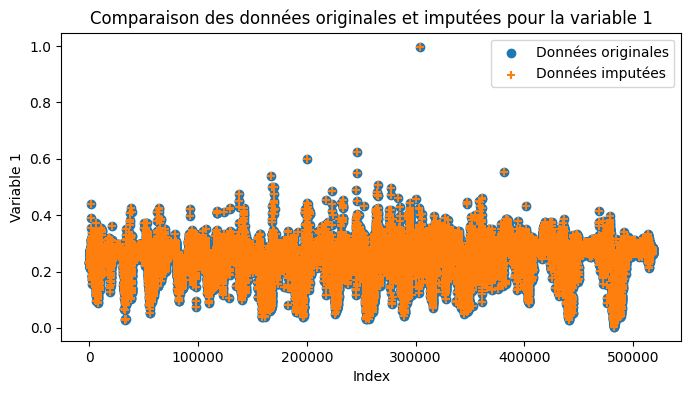

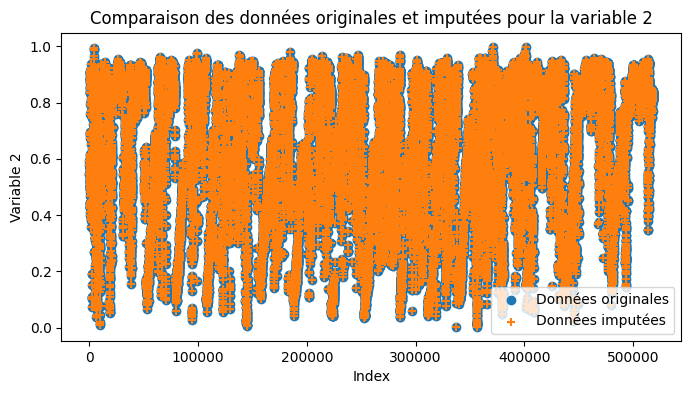

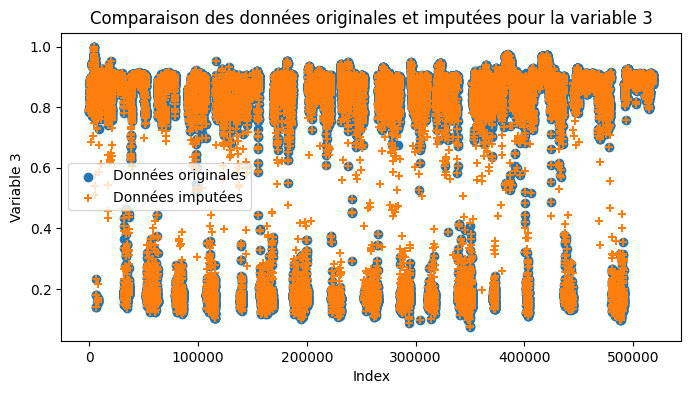

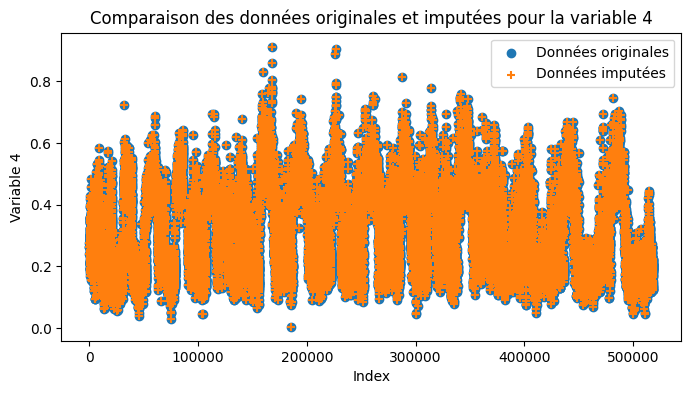

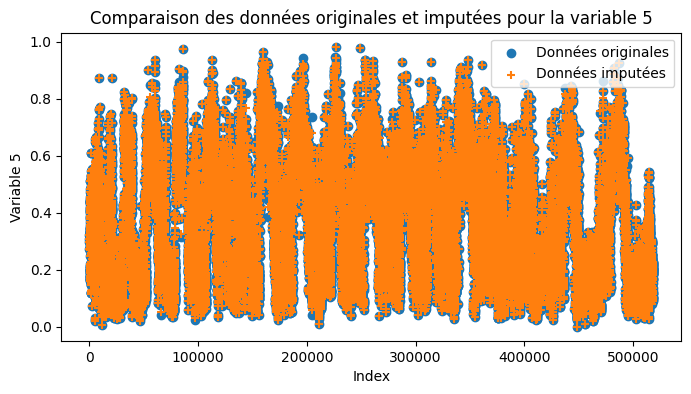

In [22]:
# Visualisation de la comparaison pour toutes les variables
num_variables = sampled_data.shape[1]  # Nombre de colonnes (variables)

for i in range(num_variables):
    plt.figure(figsize=(8, 4))
    plt.scatter(sampled_data.index, sampled_data.values[:, i], label='Données originales')
    plt.scatter(sampled_data_missing.index, imputed_data_with_missing[:, i], label='Données imputées', marker='+')
    plt.xlabel("Index")
    plt.ylabel(f"Variable {i+1}")
    plt.title(f"Comparaison des données originales et imputées pour la variable {i+1}")
    plt.legend()
    plt.show()

# Imputation sur le jeu de données de base :

In [23]:
# Charger le fichier Excel
data = pd.read_excel('/content/drive/MyDrive/pCO2_Dataset.xlsx')
data

,DATE,LAT,LON,pCO2w,SST,SSS,Chla,aCDOM
0,19970916,49.180000,-133.470000,317.15253,16.150000,32.495998,-0.442036,-1.631763
1,19970916,49.009998,-131.149990,312.06076,17.080000,32.487000,-0.563070,-1.806464
2,19970916,48.990002,-130.970000,321.26727,17.160000,32.333000,-0.558054,-1.751414
3,19970916,43.342999,-126.500000,323.05075,18.150000,31.799999,-0.274361,-1.571059
4,19970920,43.000000,-126.610000,332.33185,18.500000,31.860001,-0.570405,-1.637942
...,...,...,...,...,...,...,...,...
518399,20190216,25.313000,-80.019997,386.02570,26.275999,36.104000,-0.929724,-1.929925
518400,20190216,25.363001,-80.000000,385.26898,26.295000,36.105000,-0.917863,-1.940228
518401,20190216,25.402000,-79.989998,385.69553,26.283001,36.105999,-0.945508,-1.953255
518402,20190216,25.429001,-79.989998,385.72369,26.280001,36.105000,-0.934618,-1.951519


In [24]:
# Supprimer les colonnes 'DATE', 'LAT' et 'LON'
data = data.drop(columns=['DATE', 'LAT', 'LON'])

In [25]:
# 1. Échantillonnage aléatoire de 1% des données
sampled_data = data.sample(frac=0.10, random_state=123)

In [26]:
sampled_data.shape

(51840, 5)

In [27]:
rf_regressor = RandomForestRegressor(n_estimators=150, max_features="sqrt", max_depth= 150, random_state=123)
rf_imputer = IterativeImputer(estimator=rf_regressor, max_iter=10, random_state=123)

In [28]:
# Appliquer l'imputation
data_imputed = rf_imputer.fit_transform(sampled_data)
print("Imputation avec RandomForest effectuée avec succès.")

Imputation avec RandomForest effectuée avec succès.


/usr/local/lib/python3.10/dist-packages/sklearn/impute/_iterative.py:825: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


In [29]:
data_imputed.shape

(51840, 5)

In [30]:

data_imputed = pd.DataFrame(data_imputed, columns=sampled_data.columns)

In [31]:
data_imputed.shape

(51840, 5)

In [32]:
data_imputed.head()

,pCO2w,SST,SSS,Chla,aCDOM
0,413.54446,14.240,33.348999,-0.097895,-1.290376
1,347.09283,19.895,34.828999,-0.524575,-1.640305
2,464.84143,12.610,5.920000,0.697885,-0.400830
3,317.35059,2.930,7.220000,1.087064,-0.558199
4,190.61244,14.500,30.399000,0.289555,-1.012259


In [33]:
# Afficher le nombre de valeurs manquantes (NaN) dans chaque colonne apres l'application de l'imputation
nan_count = data_imputed.isna().sum()
print(nan_count)

pCO2w    0
SST      0
SSS      0
Chla     0
aCDOM    0
dtype: int64


# Gestion des valeurs abberrantes :

In [34]:
from sklearn.preprocessing import MinMaxScaler

# Sélectionner les colonnes numériques à normaliser
numerical_cols = data.select_dtypes(include=np.number).columns

# Créer un scaler MinMaxScaler
scaler = MinMaxScaler()

# Normaliser les colonnes numériques
data_imputed[numerical_cols] = scaler.fit_transform(data_imputed[numerical_cols])

# Afficher les premières lignes du DataFrame normalisé
print(data.head())

       pCO2w    SST        SSS     Chla      aCDOM
0  317.15253  16.15  32.495998 -0.442036 -1.631763
1  312.06076  17.08  32.487000 -0.563070 -1.806464
2  321.26727  17.16  32.333000 -0.558054 -1.751414
3  323.05075  18.15  31.799999 -0.274361 -1.571059
4  332.33185  18.50  31.860001 -0.570405 -1.637942


Nombre de valeurs aberrantes sur les 2 premières composantes : 8
Nombre de valeurs aberrantes sur les 2 dernières composantes : 1200
Nombre total de valeurs aberrantes détectées : 1208


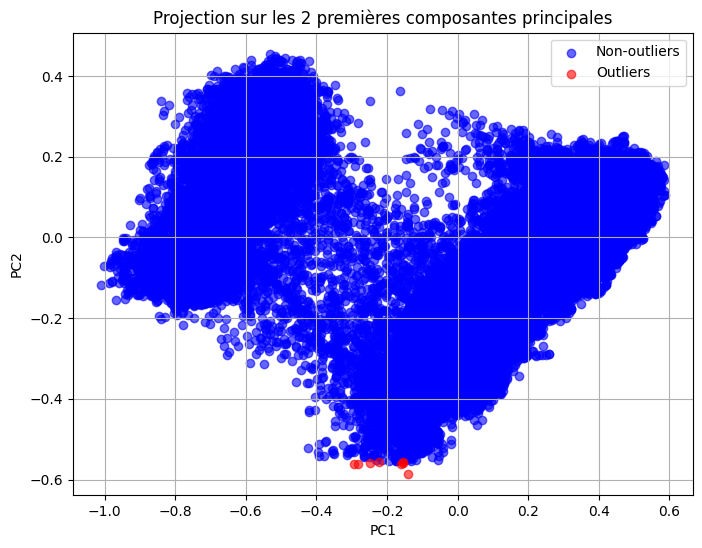

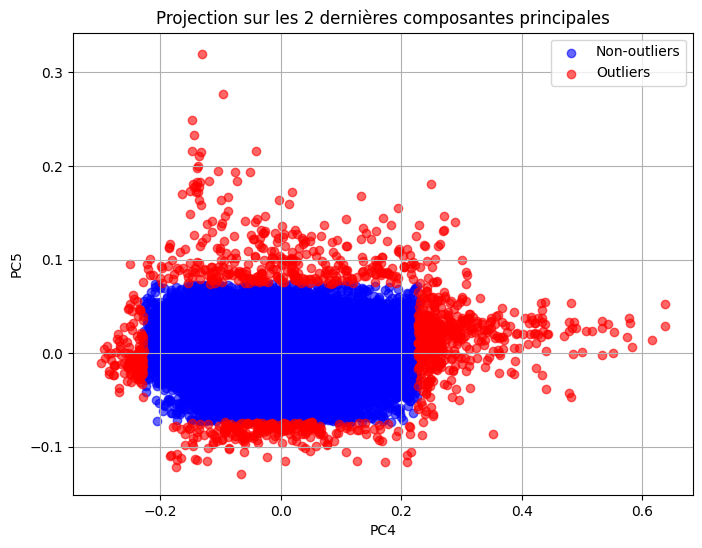

In [35]:
import numpy as np
from sklearn.decomposition import PCA
from scipy.stats import zscore
import matplotlib.pyplot as plt

# Effectuer une ACP
pca = PCA()
data_pca = pca.fit_transform(data_imputed)

# Analyse des 2 premières composantes principales
first_components = data_pca[:, :2]
z_scores_first = np.abs(zscore(first_components))
outliers_first = (z_scores_first > 3).any(axis=1)

# Analyse des 2 dernières composantes principales
last_components = data_pca[:, -2:]
z_scores_last = np.abs(zscore(last_components))
outliers_last = (z_scores_last > 3).any(axis=1)

# Compter et afficher le nombre d'outliers
print(f"Nombre de valeurs aberrantes sur les 2 premières composantes : {outliers_first.sum()}")
print(f"Nombre de valeurs aberrantes sur les 2 dernières composantes : {outliers_last.sum()}")

# Nombre total d'outliers (si considéré unique sur l'ensemble)
total_outliers = np.logical_or(outliers_first, outliers_last).sum()
print(f"Nombre total de valeurs aberrantes détectées : {total_outliers}")

# Visualisation des données projetées sur les deux premières composantes principales
plt.figure(figsize=(8, 6))
plt.scatter(first_components[~outliers_first, 0], first_components[~outliers_first, 1],
            c='blue', label="Non-outliers", alpha=0.6)
plt.scatter(first_components[outliers_first, 0], first_components[outliers_first, 1],
            c='red', label="Outliers", alpha=0.6)
plt.title("Projection sur les 2 premières composantes principales")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend()
plt.grid(True)
plt.show()

# Visualisation des données projetées sur les deux dernières composantes principales
plt.figure(figsize=(8, 6))
plt.scatter(last_components[~outliers_last, 0], last_components[~outliers_last, 1],
            c='blue', label="Non-outliers", alpha=0.6)
plt.scatter(last_components[outliers_last, 0], last_components[outliers_last, 1],
            c='red', label="Outliers", alpha=0.6)
plt.title("Projection sur les 2 dernières composantes principales")
plt.xlabel(f"PC{data.shape[1]-1}")
plt.ylabel(f"PC{data.shape[1]}")
plt.legend()
plt.grid(True)
plt.show()


In [36]:
# Identifier les outliers basés sur les deux premières composantes principales
outliers_pca = outliers_first | outliers_last

# Retirer les outliers du DataFrame
data_imputed_no_outliers = data_imputed[~outliers_pca]

# Afficher la taille du DataFrame après suppression des outliers
print(f"Taille du DataFrame après suppression des outliers : {data_imputed_no_outliers.shape}")

Taille du DataFrame après suppression des outliers : (50632, 5)


Nombre de valeurs aberrantes détectées par Isolation Forest : 2592
Nombre de valeurs aberrantes détectées par LOF : 2592
Nombre de valeurs aberrantes détectées par DBSCAN : 0


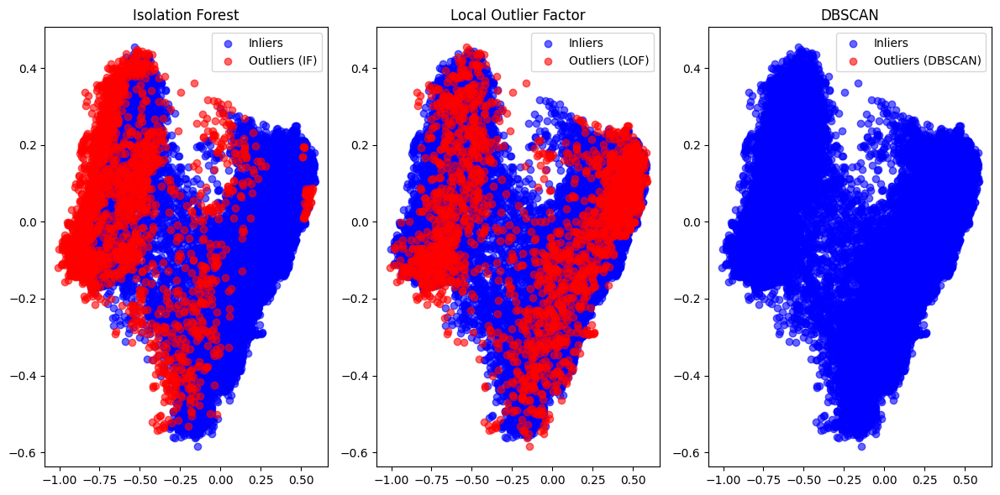

Shape of original data: (51840, 5)
Shape of data without outliers (using Isolation Forest): (49248, 5)


In [37]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt

# 1. PCA for outlier detection
pca = PCA(n_components=2)  # Reduce to 2 dimensions for visualization
pca_result = pca.fit_transform(data_imputed)

# 2. Outlier detection methods
# Isolation Forest
iso_forest = IsolationForest(contamination=0.05, random_state=42)  # Adjust contamination as needed
outliers_iso = iso_forest.fit_predict(data_imputed)
n_outliers_iso = (outliers_iso == -1).sum()  # Count outliers

# Local Outlier Factor (LOF)
lof = LocalOutlierFactor(n_neighbors=20, contamination=0.05)  # Adjust parameters
outliers_lof = lof.fit_predict(data_imputed)
n_outliers_lof = (outliers_lof == -1).sum()  # Count outliers

# DBSCAN
dbscan = DBSCAN(eps=0.5, min_samples=5)  # Adjust parameters
outliers_dbscan = dbscan.fit_predict(data_imputed)
n_outliers_dbscan = (outliers_dbscan == -1).sum()  # Count outliers (noise points are labeled as -1)

# Print number of outliers detected by each method
print(f"Nombre de valeurs aberrantes détectées par Isolation Forest : {n_outliers_iso}")
print(f"Nombre de valeurs aberrantes détectées par LOF : {n_outliers_lof}")
print(f"Nombre de valeurs aberrantes détectées par DBSCAN : {n_outliers_dbscan}")

# 3. Visualization with colored outliers
plt.figure(figsize=(12, 6))

# Plot PCA results, color-coding outliers
plt.subplot(1, 3, 1)
plt.scatter(pca_result[outliers_iso == 1, 0], pca_result[outliers_iso == 1, 1], label='Inliers', c='blue', alpha=0.6)
plt.scatter(pca_result[outliers_iso == -1, 0], pca_result[outliers_iso == -1, 1], label='Outliers (IF)', c='red', alpha=0.6)
plt.title('Isolation Forest')
plt.legend()

plt.subplot(1, 3, 2)
plt.scatter(pca_result[outliers_lof == 1, 0], pca_result[outliers_lof == 1, 1], label='Inliers', c='blue', alpha=0.6)
plt.scatter(pca_result[outliers_lof == -1, 0], pca_result[outliers_lof == -1, 1], label='Outliers (LOF)', c='red', alpha=0.6)
plt.title('Local Outlier Factor')
plt.legend()

plt.subplot(1, 3, 3)
plt.scatter(pca_result[outliers_dbscan == 0, 0], pca_result[outliers_dbscan == 0, 1], label='Inliers', c='blue', alpha=0.6)
plt.scatter(pca_result[outliers_dbscan == -1, 0], pca_result[outliers_dbscan == -1, 1], label='Outliers (DBSCAN)', c='red', alpha=0.6)
plt.title('DBSCAN')
plt.legend()

plt.tight_layout()
plt.show()

# 4. Restrict to non-outliers (example using Isolation Forest)
non_outliers_indices = np.where(outliers_iso == 1)
non_outliers_data = data_imputed.iloc[non_outliers_indices]

print("Shape of original data:", data_imputed.shape)
print("Shape of data without outliers (using Isolation Forest):", non_outliers_data.shape)


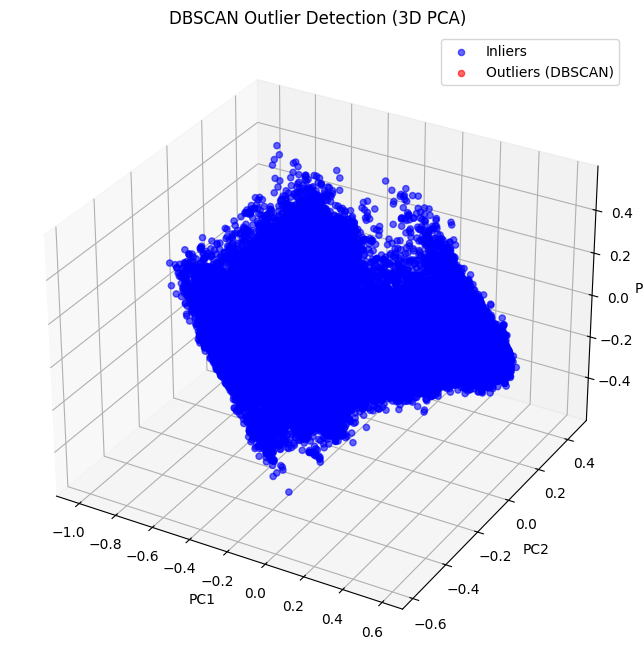

In [38]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# 1. PCA for 3D visualization
pca = PCA(n_components=3)
pca_result_3d = pca.fit_transform(data_imputed)

# 2. 3D plot with colored outliers
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot inliers and outliers
ax.scatter(pca_result_3d[outliers_dbscan == 0, 0], pca_result_3d[outliers_dbscan == 0, 1], pca_result_3d[outliers_dbscan == 0, 2],
           c='blue', label='Inliers', alpha=0.6)
ax.scatter(pca_result_3d[outliers_dbscan == -1, 0], pca_result_3d[outliers_dbscan == -1, 1], pca_result_3d[outliers_dbscan == -1, 2],
           c='red', label='Outliers (DBSCAN)', alpha=0.6)


ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
ax.set_title('DBSCAN Outlier Detection (3D PCA)')
ax.legend()
plt.show()

Nombre de valeurs aberrantes détectées par Isolation Forest : 2592
Nombre de valeurs aberrantes détectées par LOF : 2592
Nombre de valeurs aberrantes détectées par DBSCAN : 0


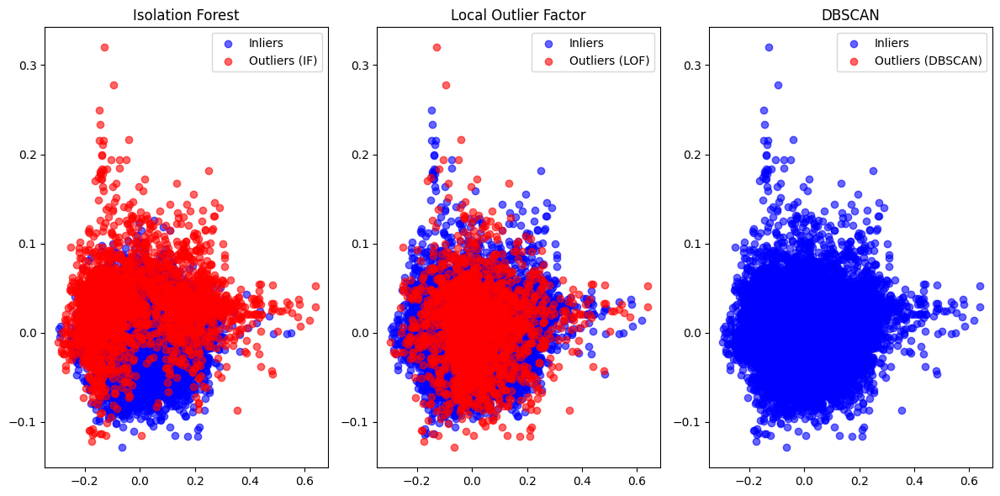

Shape of original data: (51840, 5)
Shape of data without outliers (using Isolation Forest): (49248, 5)


In [39]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt

# 1. PCA for outlier detection using the last two components
pca = PCA(n_components=None)  # Retain all components to access the last two
pca_result = pca.fit_transform(data_imputed)
# Select the last two components for visualization
pca_last_two = pca_result[:, -2:]

# 2. Outlier detection methods
# Isolation Forest
iso_forest = IsolationForest(contamination=0.05, random_state=42)  # Adjust contamination as needed
outliers_iso = iso_forest.fit_predict(data_imputed)
n_outliers_iso = (outliers_iso == -1).sum()  # Count outliers

# Local Outlier Factor (LOF)
lof = LocalOutlierFactor(n_neighbors=20, contamination=0.05)  # Adjust parameters
outliers_lof = lof.fit_predict(data_imputed)
n_outliers_lof = (outliers_lof == -1).sum()  # Count outliers

# DBSCAN
dbscan = DBSCAN(eps=0.5, min_samples=5)  # Adjust parameters
outliers_dbscan = dbscan.fit_predict(data_imputed)
n_outliers_dbscan = (outliers_dbscan == -1).sum()  # Count outliers (noise points are labeled as -1)

# Print number of outliers detected by each method
print(f"Nombre de valeurs aberrantes détectées par Isolation Forest : {n_outliers_iso}")
print(f"Nombre de valeurs aberrantes détectées par LOF : {n_outliers_lof}")
print(f"Nombre de valeurs aberrantes détectées par DBSCAN : {n_outliers_dbscan}")

# 3. Visualization with colored outliers
plt.figure(figsize=(12, 6))

# Plot PCA results, color-coding outliers using the last two components
plt.subplot(1, 3, 1)
plt.scatter(pca_last_two[outliers_iso == 1, 0], pca_last_two[outliers_iso == 1, 1], label='Inliers', c='blue', alpha=0.6)
plt.scatter(pca_last_two[outliers_iso == -1, 0], pca_last_two[outliers_iso == -1, 1], label='Outliers (IF)', c='red', alpha=0.6)
plt.title('Isolation Forest')
plt.legend()

plt.subplot(1, 3, 2)
plt.scatter(pca_last_two[outliers_lof == 1, 0], pca_last_two[outliers_lof == 1, 1], label='Inliers', c='blue', alpha=0.6)
plt.scatter(pca_last_two[outliers_lof == -1, 0], pca_last_two[outliers_lof == -1, 1], label='Outliers (LOF)', c='red', alpha=0.6)
plt.title('Local Outlier Factor')
plt.legend()

plt.subplot(1, 3, 3)
plt.scatter(pca_last_two[outliers_dbscan == 0, 0], pca_last_two[outliers_dbscan == 0, 1], label='Inliers', c='blue', alpha=0.6)
plt.scatter(pca_last_two[outliers_dbscan != 0, 0], pca_last_two[outliers_dbscan != 0, 1], label='Outliers (DBSCAN)', c='red', alpha=0.6)
plt.title('DBSCAN')
plt.legend()

plt.tight_layout()
plt.show()

# 4. Restrict to non-outliers (example using Isolation Forest)
non_outliers_indices = np.where(outliers_iso == 1)
non_outliers_data = data_imputed.iloc[non_outliers_indices]

print("Shape of original data:", data_imputed.shape)
print("Shape of data without outliers (using Isolation Forest):", non_outliers_data.shape)


#Analyse exploratoire et clustering

# ACP

In [40]:
!pip install minisom


  Preparing metadata (setup.py) ... done
  Created wheel for minisom: filename=MiniSom-2.3.3-py3-none-any.whl size=11706 sha256=3e7a35f1ce3539cd174ea11755019e86a6f9c15c206719137a816209576de2d4
  Stored in directory: /root/.cache/pip/wheels/96/98/a5/52dee3e8ed1dbfc4d77e4da41b6d89dd7ab9ead1b921e766f8
Successfully built minisom


Variance expliquée : [0.79020478 0.14102216 0.04742391 0.01936508 0.00198407]
Variance cumulée : [0.79020478 0.93122694 0.97865085 0.99801593 1.        ]


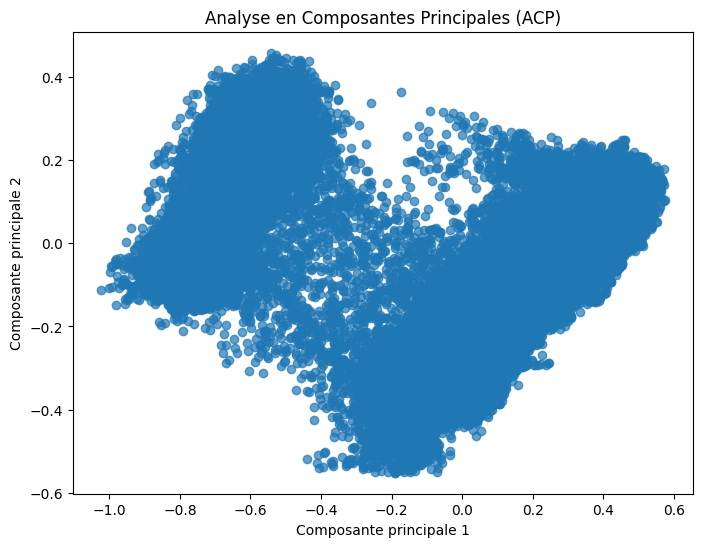

In [41]:
# 4. ACP - Identifier les liens entre variables
variables_actives = data_imputed_no_outliers.columns
pca = PCA(n_components=len(variables_actives))
pca_result = pca.fit_transform(data_imputed_no_outliers)

explained_variance_ratio = pca.explained_variance_ratio_
print("Variance expliquée :", explained_variance_ratio)
print("Variance cumulée :", np.cumsum(explained_variance_ratio))
plt.figure(figsize=(8, 6))
plt.scatter(pca_result[:, 0], pca_result[:, 1], alpha=0.7)
plt.xlabel("Composante principale 1")
plt.ylabel("Composante principale 2")
plt.title("Analyse en Composantes Principales (ACP)")
plt.show()

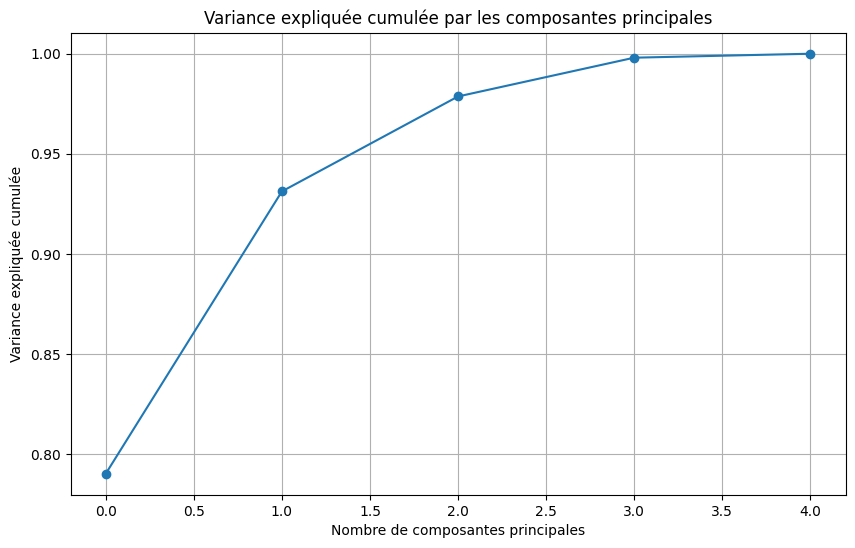

In [86]:
# prompt: graphe variance expliquée pour ACP

# Code to generate the explained variance plot

plt.figure(figsize=(10, 6))
plt.plot(np.cumsum(explained_variance_ratio), marker='o')
plt.xlabel('Nombre de composantes principales')
plt.ylabel('Variance expliquée cumulée')
plt.title('Variance expliquée cumulée par les composantes principales')
plt.grid(True)
plt.show()

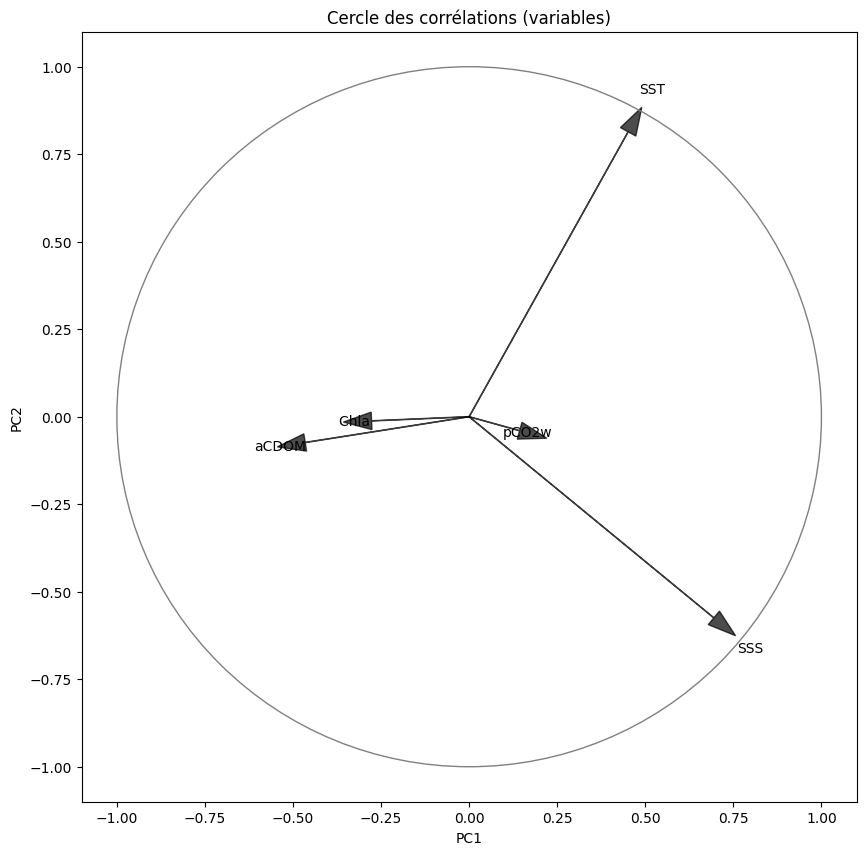

In [90]:
# prompt: cercle de correlation  des variables avec le plan principal avec les flèches

#Cercle de corrélation
pcs = pca.components_
n_comp = 2 # Nombre de composantes principales à afficher

plt.figure(figsize=(10, 10))
for i, (x, y) in enumerate(zip(pcs[0, :], pcs[1, :])):
    # Afficher un vecteur pour chaque variable
    plt.arrow(0, 0, x, y, color='k', alpha=0.7, head_width=0.05, head_length=0.08)
    plt.text(x * 1.15, y * 1.15, variables_actives[i], color='k', ha='center', va='center', fontsize=10)

# Cercle
cercle = plt.Circle((0, 0), 1, color='grey', fill=False)
plt.gca().add_patch(cercle)

# Axes
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("Cercle des corrélations (variables)")

# Limites des axes
plt.xlim((-1.1, 1.1))
plt.ylim((-1.1, 1.1))

plt.show()

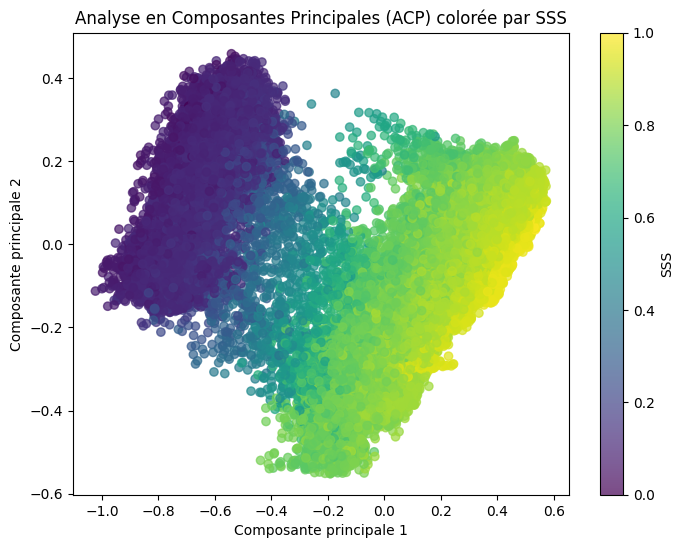

In [42]:
import matplotlib.pyplot as plt

sss_values = data_imputed_no_outliers['SSS']

# Create the scatter plot with color based on 'SSS' values
plt.figure(figsize=(8, 6))
plt.scatter(pca_result[:, 0], pca_result[:, 1], c=sss_values, cmap='viridis', alpha=0.7)  # Use a colormap for better visualization
plt.colorbar(label='SSS')  # Add a colorbar to show the 'SSS' values
plt.xlabel("Composante principale 1")
plt.ylabel("Composante principale 2")
plt.title("Analyse en Composantes Principales (ACP) colorée par SSS")
plt.show()

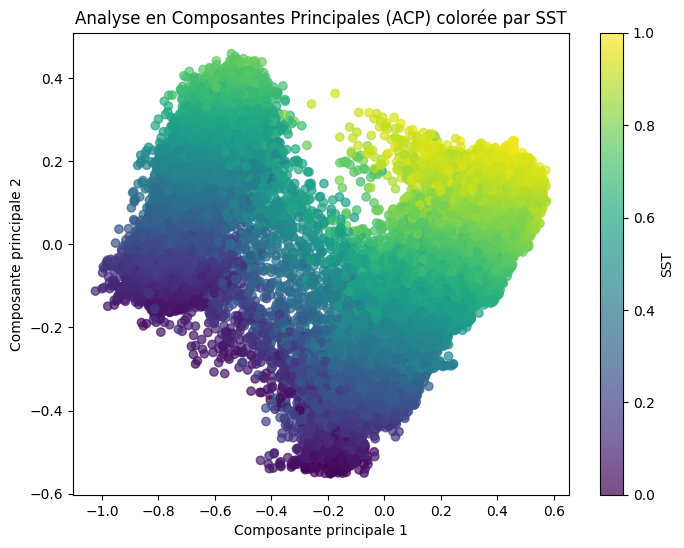

In [43]:
import matplotlib.pyplot as plt

sss_values = data_imputed_no_outliers['SST']

# Create the scatter plot with color based on 'SSS' values
plt.figure(figsize=(8, 6))
plt.scatter(pca_result[:, 0], pca_result[:, 1], c=sss_values, cmap='viridis', alpha=0.7)  # Use a colormap for better visualization
plt.colorbar(label='SST')  # Add a colorbar to show the 'SSS' values
plt.xlabel("Composante principale 1")
plt.ylabel("Composante principale 2")
plt.title("Analyse en Composantes Principales (ACP) colorée par SST")
plt.show()

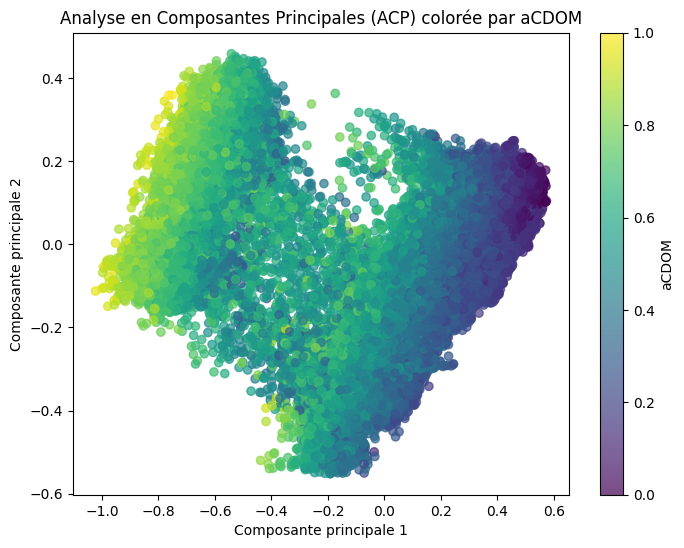

In [44]:
import matplotlib.pyplot as plt

sss_values = data_imputed_no_outliers['aCDOM']

# Create the scatter plot with color based on 'SSS' values
plt.figure(figsize=(8, 6))
plt.scatter(pca_result[:, 0], pca_result[:, 1], c=sss_values, cmap='viridis', alpha=0.7)  # Use a colormap for better visualization
plt.colorbar(label='aCDOM')  # Add a colorbar to show the 'SSS' values
plt.xlabel("Composante principale 1")
plt.ylabel("Composante principale 2")
plt.title("Analyse en Composantes Principales (ACP) colorée par aCDOM")
plt.show()

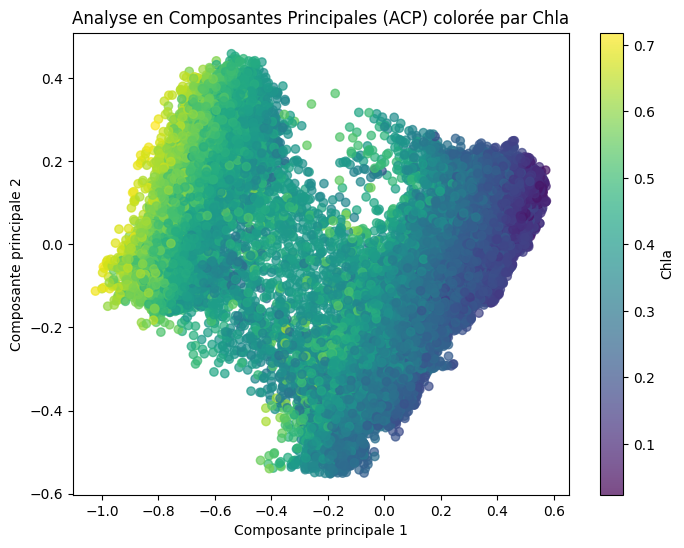

In [45]:
import matplotlib.pyplot as plt

sss_values = data_imputed_no_outliers['Chla ']

# Create the scatter plot with color based on 'SSS' values
plt.figure(figsize=(8, 6))
plt.scatter(pca_result[:, 0], pca_result[:, 1], c=sss_values, cmap='viridis', alpha=0.7)  # Use a colormap for better visualization
plt.colorbar(label='Chla')  # Add a colorbar to show the 'SSS' values
plt.xlabel("Composante principale 1")
plt.ylabel("Composante principale 2")
plt.title("Analyse en Composantes Principales (ACP) colorée par Chla")
plt.show()

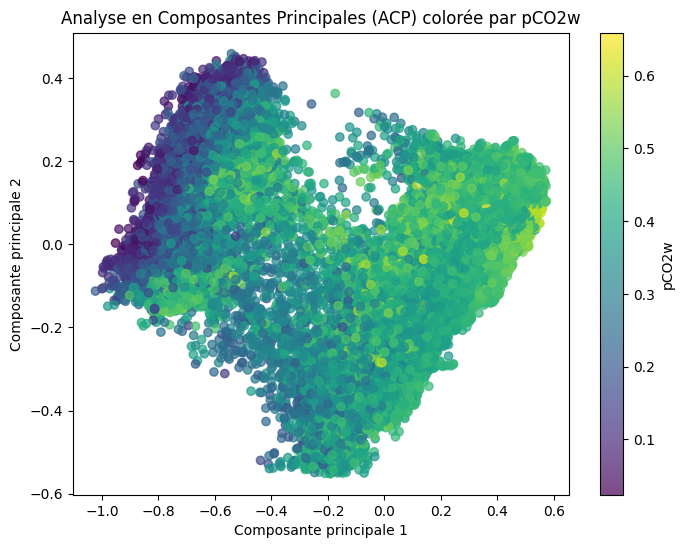

In [46]:
import matplotlib.pyplot as plt

sss_values = data_imputed_no_outliers['pCO2w']

# Create the scatter plot with color based on 'SSS' values
plt.figure(figsize=(8, 6))
plt.scatter(pca_result[:, 0], pca_result[:, 1], c=sss_values, cmap='viridis', alpha=0.7)  # Use a colormap for better visualization
plt.colorbar(label='pCO2w')  # Add a colorbar to show the 'SSS' values
plt.xlabel("Composante principale 1")
plt.ylabel("Composante principale 2")
plt.title("Analyse en Composantes Principales (ACP) colorée par pCO2w")
plt.show()

# Clustering avec KMeans

Optimal n_clusters (silhouette): 2
Optimal n_clusters (Calinski-Harabasz): 3
Optimal n_clusters (Davies-Bouldin): 2


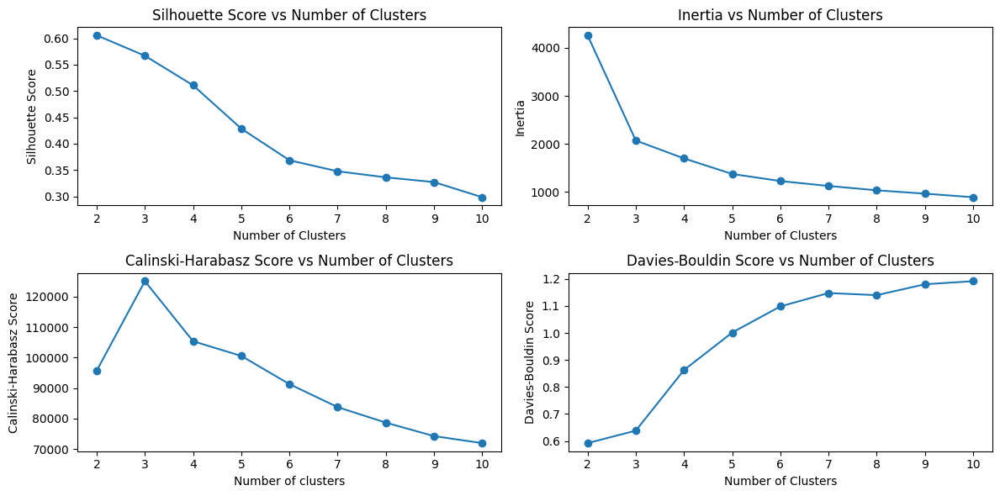

In [47]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

# Assuming 'data_imputed_no_outliers' is your preprocessed data
X = data_imputed_no_outliers

# Test different values of n_clusters
range_n_clusters = range(2, 11)  # Example: testing 2 to 10 clusters
silhouette_scores = []
inertia_values = []
calinski_harabasz_scores = []
davies_bouldin_scores = []


for n_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10) # n_init increased for better results
    cluster_labels = kmeans.fit_predict(X)

    silhouette_avg = silhouette_score(X, cluster_labels)
    silhouette_scores.append(silhouette_avg)

    inertia = kmeans.inertia_
    inertia_values.append(inertia)

    calinski_harabasz = calinski_harabasz_score(X, cluster_labels)
    calinski_harabasz_scores.append(calinski_harabasz)

    davies_bouldin = davies_bouldin_score(X, cluster_labels)
    davies_bouldin_scores.append(davies_bouldin)


# Find the optimal n_clusters based on silhouette score (maximize)
optimal_n_clusters_silhouette = range_n_clusters[silhouette_scores.index(max(silhouette_scores))]

#Find the optimal n_clusters based on Calinski-Harabasz score (maximize)
optimal_n_clusters_calinski = range_n_clusters[calinski_harabasz_scores.index(max(calinski_harabasz_scores))]

#Find the optimal n_clusters based on Davies-Bouldin score (minimize)
optimal_n_clusters_davies = range_n_clusters[davies_bouldin_scores.index(min(davies_bouldin_scores))]

print(f"Optimal n_clusters (silhouette): {optimal_n_clusters_silhouette}")
print(f"Optimal n_clusters (Calinski-Harabasz): {optimal_n_clusters_calinski}")
print(f"Optimal n_clusters (Davies-Bouldin): {optimal_n_clusters_davies}")

# Plotting
plt.figure(figsize=(12, 6))

plt.subplot(2, 2, 1)
plt.plot(range_n_clusters, silhouette_scores, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score vs Number of Clusters')


plt.subplot(2, 2, 2)
plt.plot(range_n_clusters, inertia_values, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Inertia vs Number of Clusters')

plt.subplot(2,2,3)
plt.plot(range_n_clusters, calinski_harabasz_scores, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Calinski-Harabasz Score')
plt.title('Calinski-Harabasz Score vs Number of Clusters')

plt.subplot(2,2,4)
plt.plot(range_n_clusters, davies_bouldin_scores, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Davies-Bouldin Score')
plt.title('Davies-Bouldin Score vs Number of Clusters')

plt.tight_layout()
plt.show()

In [48]:
# Clustering avec K-means
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=2, random_state=123)
data_imputed_no_outliers['Cluster'] = kmeans.fit_predict(data_imputed_no_outliers)

<ipython-input-48-95dec334686a>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_imputed_no_outliers['Cluster'] = kmeans.fit_predict(data_imputed_no_outliers)


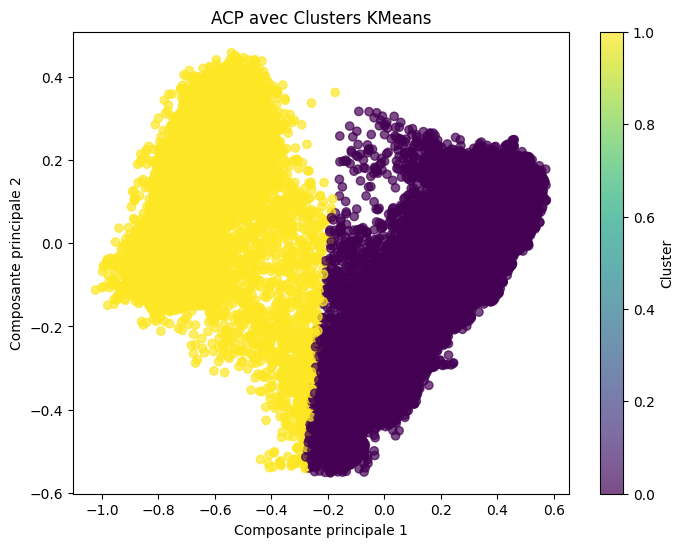

In [49]:
import matplotlib.pyplot as plt

# Get the cluster labels
cluster_labels = data_imputed_no_outliers['Cluster']

# Create the scatter plot with color based on cluster labels
plt.figure(figsize=(8, 6))
plt.scatter(pca_result[:, 0], pca_result[:, 1], c=cluster_labels, cmap='viridis', alpha=0.7)
plt.colorbar(label='Cluster')  # Add a colorbar to show the cluster labels
plt.xlabel("Composante principale 1")
plt.ylabel("Composante principale 2")
plt.title("ACP avec Clusters KMeans")
plt.show()

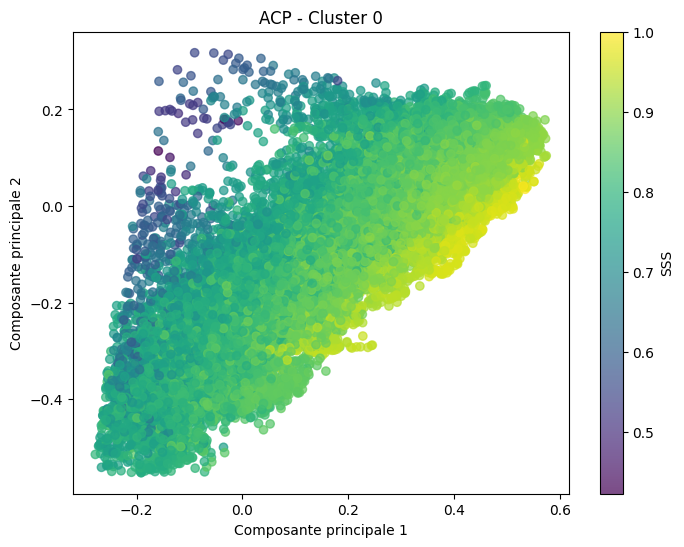

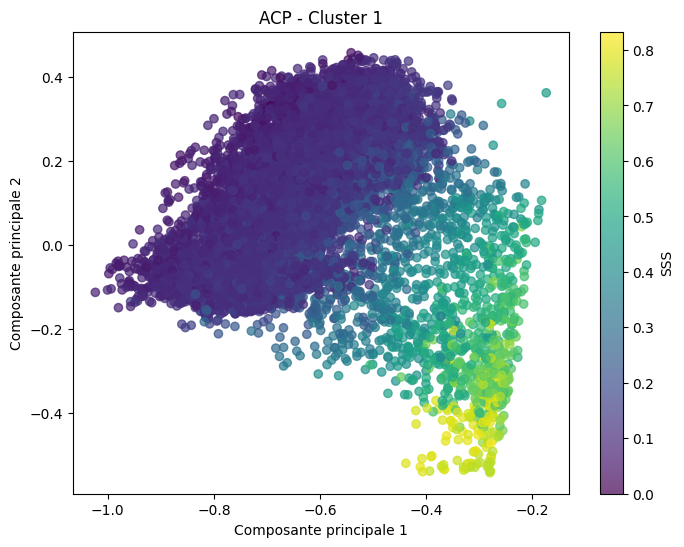

In [50]:
import matplotlib.pyplot as plt

# Get the cluster labels
cluster_labels = data_imputed_no_outliers['Cluster']

# Get unique cluster labels
unique_clusters = data_imputed_no_outliers['Cluster'].unique()

# Create a scatter plot for each cluster
for cluster in unique_clusters:
    cluster_data = data_imputed_no_outliers[data_imputed_no_outliers['Cluster'] == cluster]
    cluster_pca_result = pca_result[data_imputed_no_outliers['Cluster'] == cluster]

    plt.figure(figsize=(8, 6))  # New figure for each cluster
    plt.scatter(cluster_pca_result[:, 0], cluster_pca_result[:, 1], c=cluster_data['SSS'], cmap='viridis', alpha=0.7)
    plt.colorbar(label='SSS')  # Colorbar for SSS
    plt.xlabel("Composante principale 1")
    plt.ylabel("Composante principale 2")
    plt.title(f"ACP - Cluster {cluster}")
    plt.show()

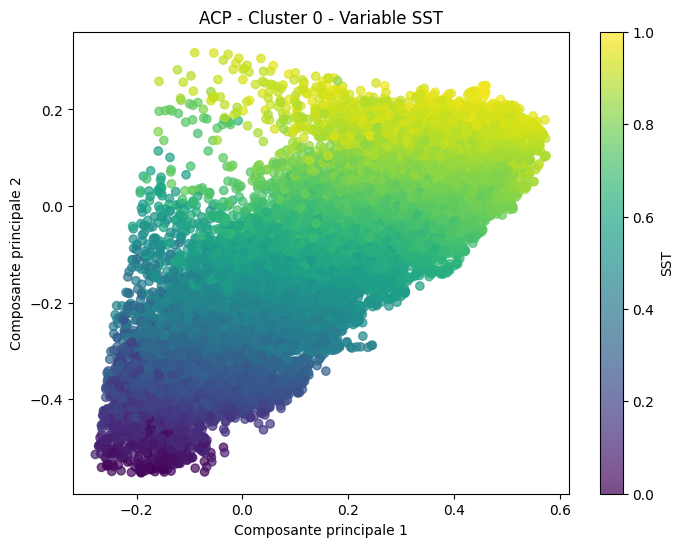

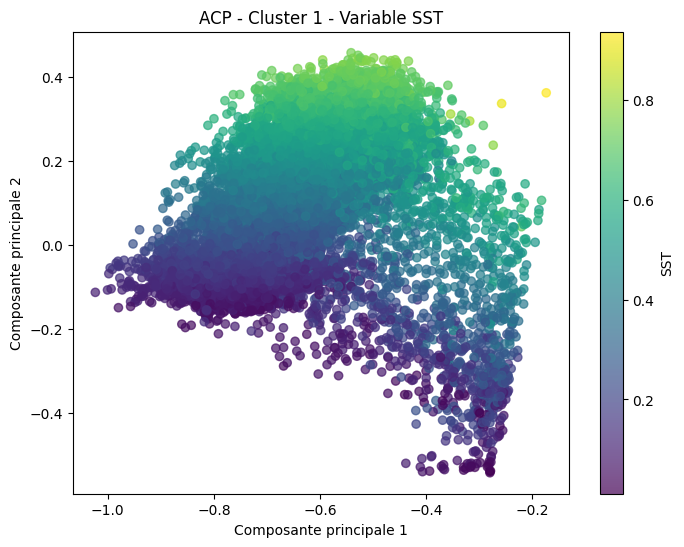

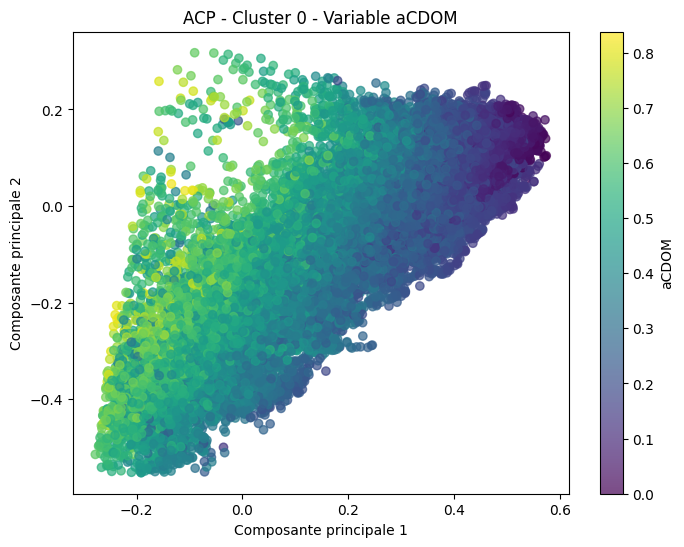

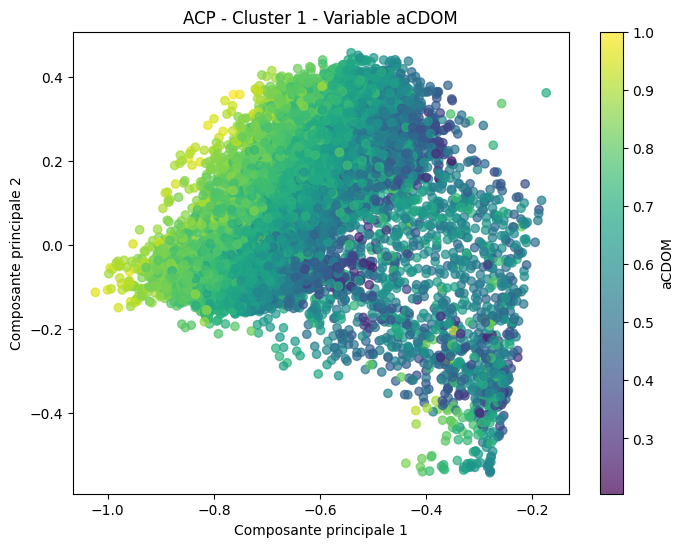

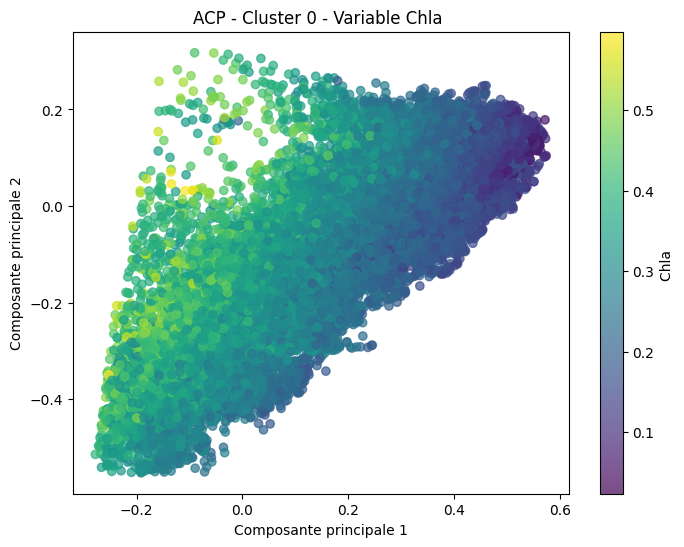

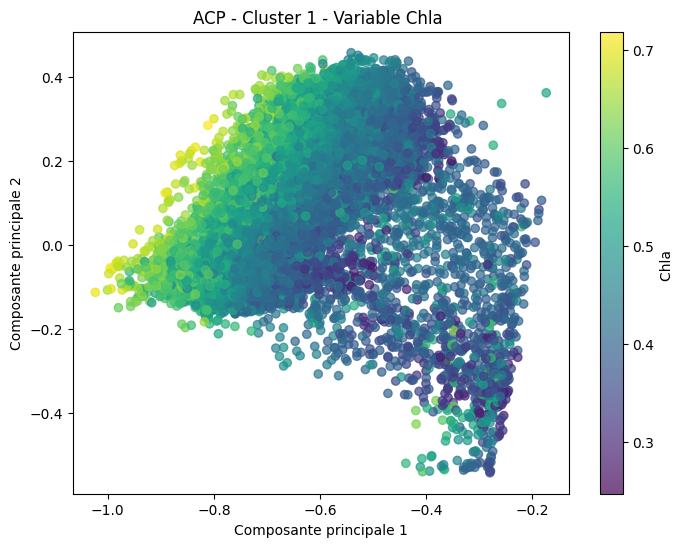

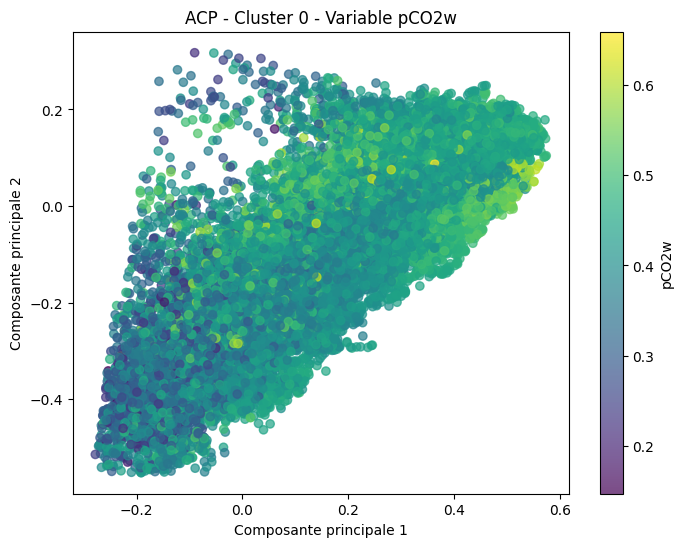

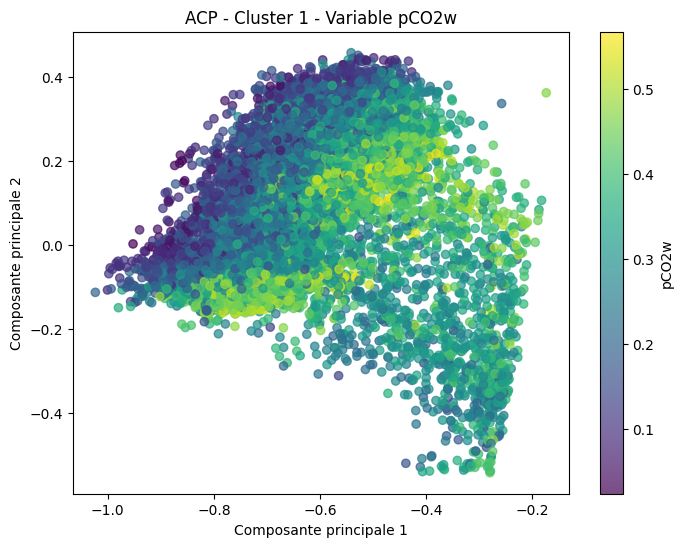

In [51]:
# Get the cluster labels
cluster_labels = data_imputed_no_outliers['Cluster']

# Get unique cluster labels
unique_clusters = data_imputed_no_outliers['Cluster'].unique()

# List of variables to plot
variables = ['SST', 'aCDOM', 'Chla ', 'pCO2w']

# Create a scatter plot for each cluster and variable
for var in variables:

    for cluster in unique_clusters:
        cluster_data = data_imputed_no_outliers[data_imputed_no_outliers['Cluster'] == cluster]
        cluster_pca_result = pca_result[data_imputed_no_outliers['Cluster'] == cluster]
        plt.figure(figsize=(8, 6))  # New figure for each cluster and variable
        plt.scatter(cluster_pca_result[:, 0], cluster_pca_result[:, 1], c=cluster_data[var], cmap='viridis', alpha=0.7)
        plt.colorbar(label=var)  # Colorbar for the current variable
        plt.xlabel("Composante principale 1")
        plt.ylabel("Composante principale 2")
        plt.title(f"ACP - Cluster {cluster} - Variable {var}")
        plt.show()

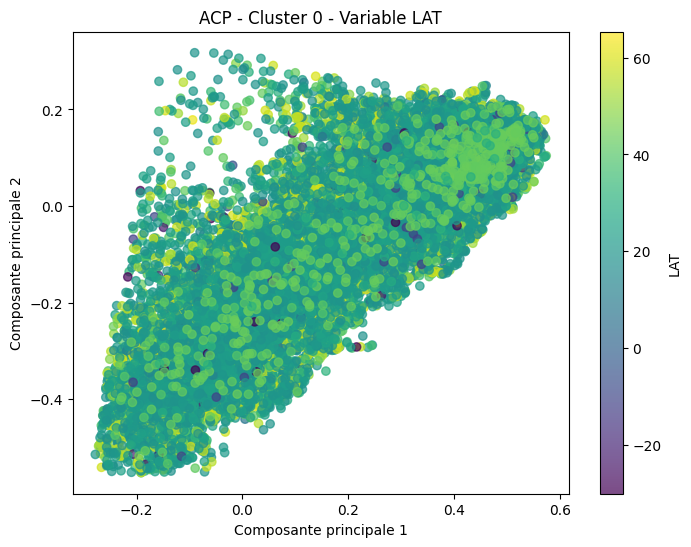

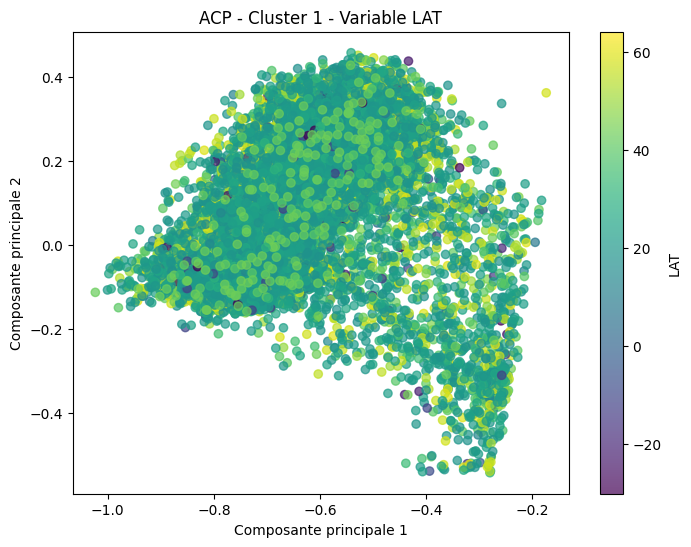

In [70]:
# 1. Merge LAT and LON back into the data
original_data = pd.read_excel('/content/drive/MyDrive/pCO2_Dataset.xlsx')
data_with_latlon = pd.merge(data_imputed_no_outliers, original_data[['LAT', 'LON']], left_index=True, right_index=True)

# 2. Visualize clusters with LAT and LON

# Get the cluster labels
cluster_labels = data_with_latlon['Cluster']

# Get unique cluster labels
unique_clusters = data_with_latlon['Cluster'].unique()

for cluster in unique_clusters:
    # Filter data for the current cluster for LAT as well
    cluster_data_with_latlon = data_with_latlon[data_with_latlon['Cluster'] == cluster]
    cluster_pca_result = pca_result[data_imputed_no_outliers['Cluster'] == cluster]
    plt.figure(figsize=(8, 6))
    # Use the filtered LAT data for coloring
    plt.scatter(cluster_pca_result[:, 0], cluster_pca_result[:, 1], c=cluster_data_with_latlon["LAT"], cmap='viridis', alpha=0.7)
    plt.colorbar(label="LAT")
    plt.xlabel("Composante principale 1")
    plt.ylabel("Composante principale 2")
    plt.title(f"ACP - Cluster {cluster} - Variable LAT") #Changed {var} to LAT for clarity
    plt.show()

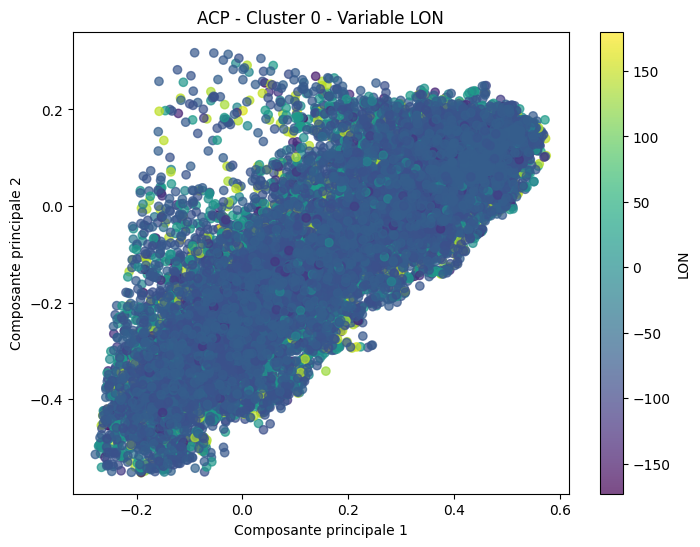

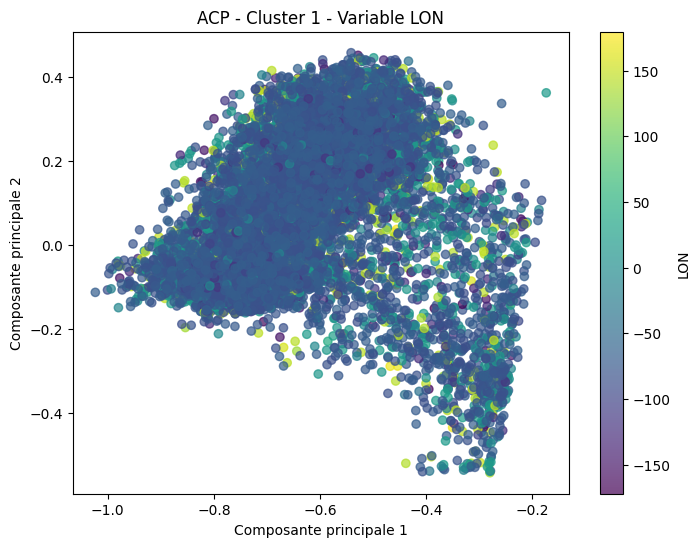

In [71]:
for cluster in unique_clusters:
    # Filter data for the current cluster for LAT as well
    cluster_data_with_latlon = data_with_latlon[data_with_latlon['Cluster'] == cluster]
    cluster_pca_result = pca_result[data_imputed_no_outliers['Cluster'] == cluster]
    plt.figure(figsize=(8, 6))
    # Use the filtered LAT data for coloring
    plt.scatter(cluster_pca_result[:, 0], cluster_pca_result[:, 1], c=cluster_data_with_latlon["LON"], cmap='viridis', alpha=0.7)
    plt.colorbar(label="LON")
    plt.xlabel("Composante principale 1")
    plt.ylabel("Composante principale 2")
    plt.title(f"ACP - Cluster {cluster} - Variable LON") #Changed {var} to LAT for clarity
    plt.show()

Il ne semble pas il y avoir de cluster régional mais il semble il y avoir deux modalités pour la salinité. A identifié de quoi s'agit t il?

# Clustering avec CAH

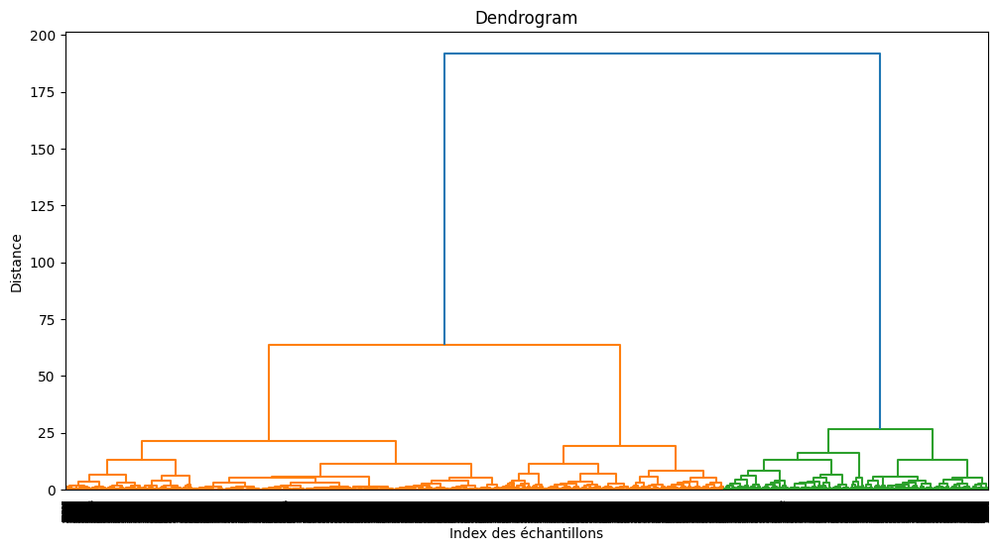

In [53]:
!pip install scipy

import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.preprocessing import StandardScaler

# 2. Perform hierarchical clustering (linkage method: ward, complete, average, single)
linked = linkage(data_imputed_no_outliers, 'ward')  # Choose your preferred linkage method

# 3. Plot the dendrogram
plt.figure(figsize=(12, 6))
dendrogram(linked, orientation='top', distance_sort='descending', show_leaf_counts=True)
plt.title('Dendrogram')
plt.xlabel('Index des échantillons')
plt.ylabel('Distance')
plt.show()

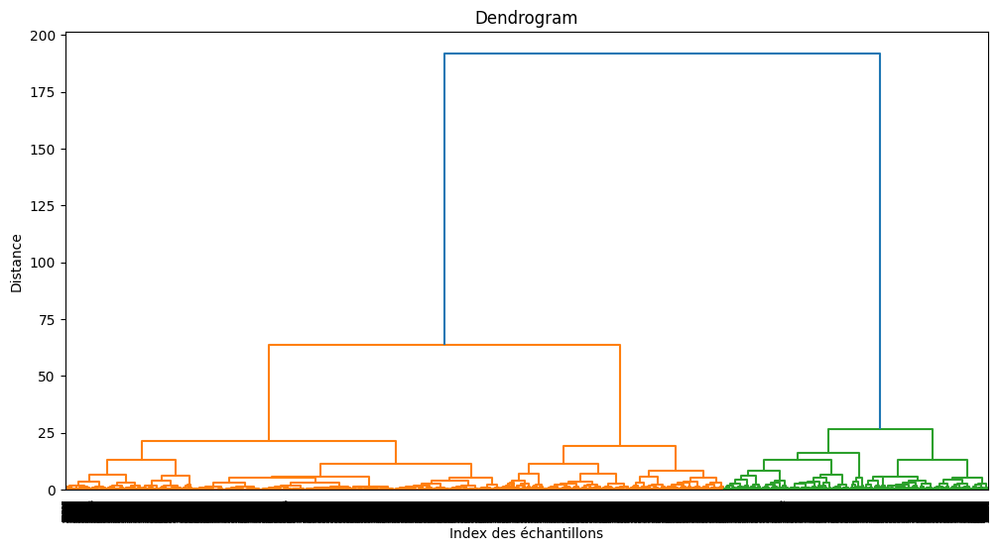

array([2, 3, 1, ..., 1, 1, 3], dtype=int32)

In [73]:
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage

# 2. Perform hierarchical clustering (linkage method: ward, complete, average, single)
linked = linkage(data_imputed_no_outliers, 'ward')  # Choose your preferred linkage method

# 3. Plot the dendrogram
plt.figure(figsize=(12, 6))
dendrogram(linked, orientation='top', distance_sort='descending', show_leaf_counts=True)
plt.title('Dendrogram')
plt.xlabel('Index des échantillons')
plt.ylabel('Distance')
plt.show()


def optimal_cut(linked, threshold):
    """
    Identifies the optimal cut-off point in the dendrogram based on a distance threshold.
    """
    # Find the clusters formed at the given threshold
    from scipy.cluster.hierarchy import fcluster
    cluster_labels = fcluster(linked, threshold, criterion='distance')
    return cluster_labels


In [75]:
# Example usage:
threshold = 70  # Adjust the threshold as needed based on the dendrogram
cluster_labels = optimal_cut(linked, threshold)

cluster_labels

array([2, 2, 1, ..., 1, 1, 2], dtype=int32)

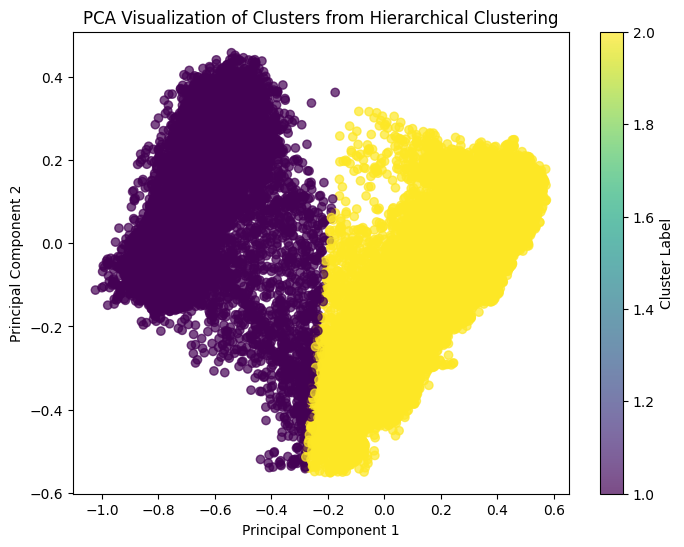

In [76]:
# 3. Plot the PCA results with cluster colors
plt.figure(figsize=(8, 6))
plt.scatter(pca_result[:, 0], pca_result[:, 1], c=cluster_labels, cmap='viridis', alpha=0.7)
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("PCA Visualization of Clusters from Hierarchical Clustering")
plt.colorbar(label="Cluster Label")
plt.show()

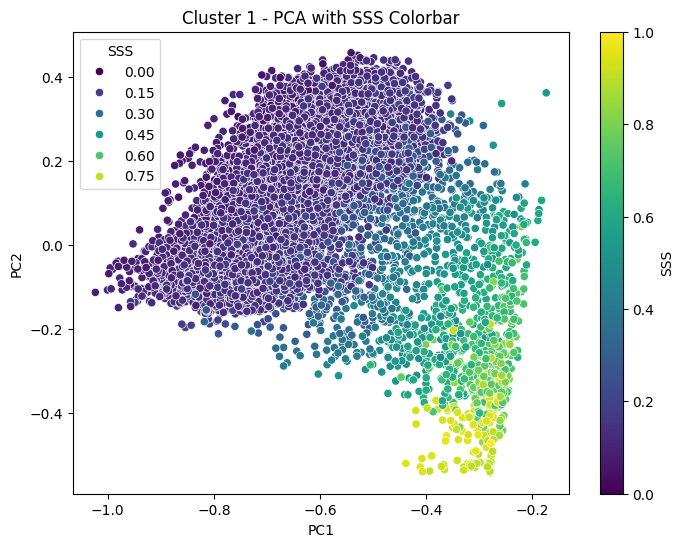

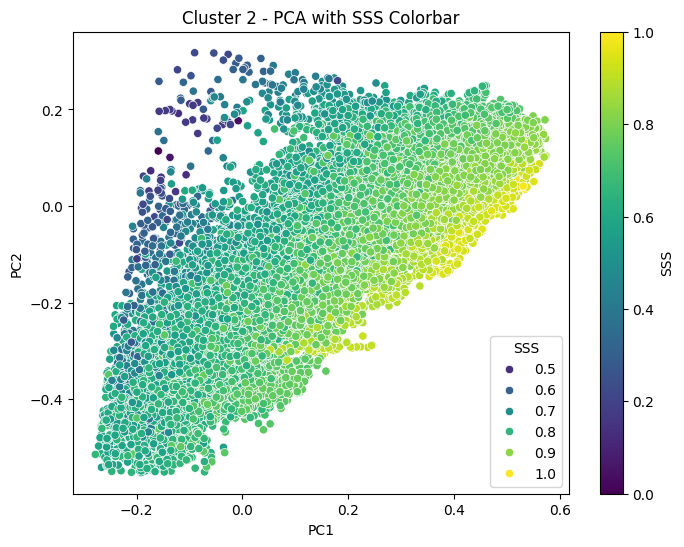

In [77]:
import matplotlib.pyplot as plt
import seaborn as sns

# Number of clusters
n_clusters = len(set(cluster_labels))

# Create separate plots for each cluster
for cluster_id in range(1, n_clusters + 1):
    cluster_data = data_imputed_no_outliers[cluster_labels == cluster_id]
    cluster_pca = pca_result[cluster_labels == cluster_id]

    plt.figure(figsize=(8, 6))
    scatter = sns.scatterplot(x=cluster_pca[:, 0], y=cluster_pca[:, 1], hue=cluster_data['SSS'], palette='viridis')

    plt.title(f"Cluster {cluster_id} - PCA with SSS Colorbar")
    plt.xlabel("PC1")
    plt.ylabel("PC2")

    # Add colorbar
    plt.colorbar(scatter.collections[0], label='SSS')

    plt.show()

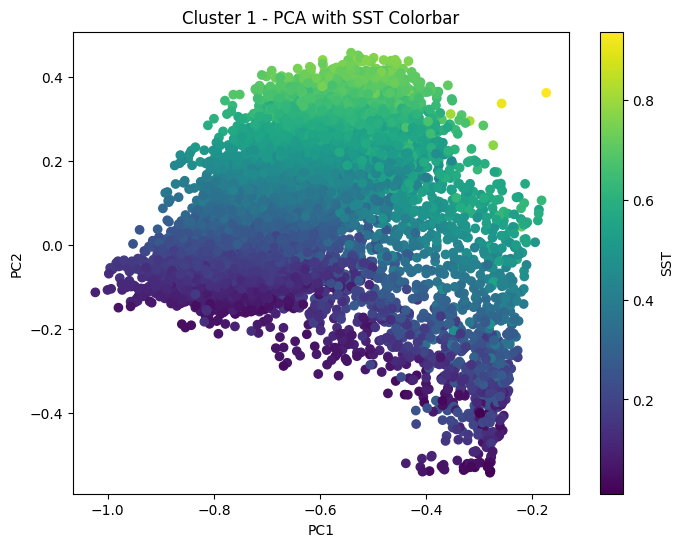

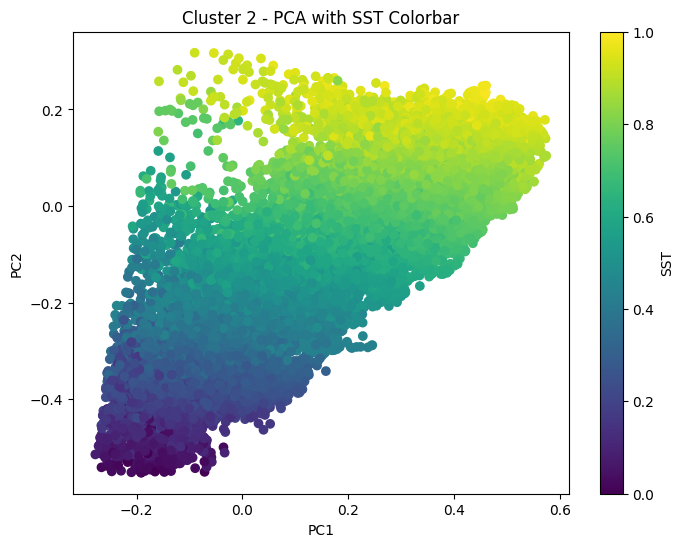

In [78]:
# Number of clusters
n_clusters = len(set(cluster_labels))

# Create separate plots for each cluster
for cluster_id in range(1, n_clusters + 1):
    cluster_data = data_imputed_no_outliers[cluster_labels == cluster_id]
    cluster_pca = pca_result[cluster_labels == cluster_id]

    plt.figure(figsize=(8, 6))

    # Use scatterplot with colorbar for SSS
    scatter = plt.scatter(cluster_pca[:, 0], cluster_pca[:, 1], c=cluster_data['SST'], cmap='viridis')

    plt.title(f"Cluster {cluster_id} - PCA with SST Colorbar")
    plt.xlabel("PC1")
    plt.ylabel("PC2")

    # Add colorbar
    plt.colorbar(scatter, label='SST')

    plt.show()

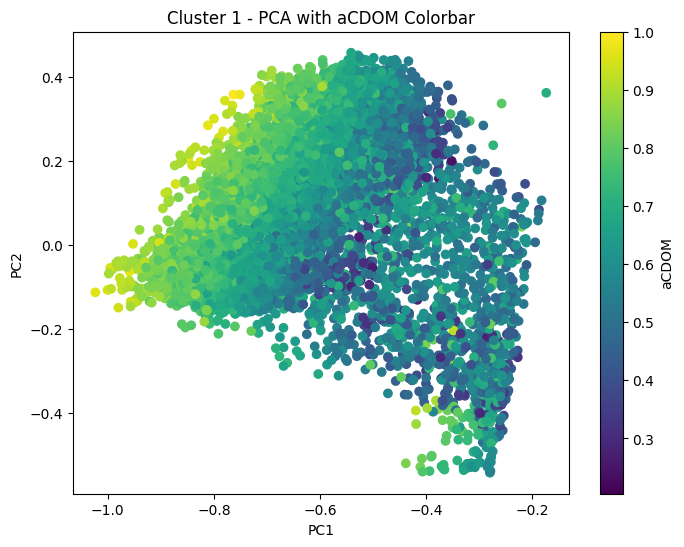

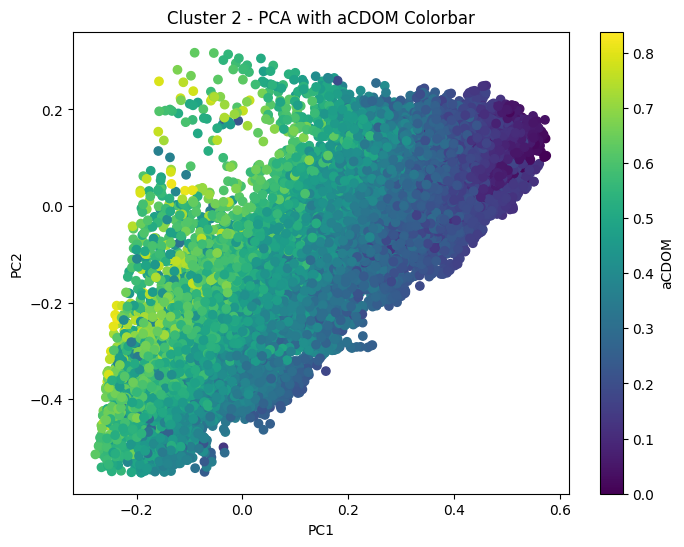

In [79]:
# Number of clusters
n_clusters = len(set(cluster_labels))

# Create separate plots for each cluster
for cluster_id in range(1, n_clusters + 1):
    cluster_data = data_imputed_no_outliers[cluster_labels == cluster_id]
    cluster_pca = pca_result[cluster_labels == cluster_id]

    plt.figure(figsize=(8, 6))

    # Use scatterplot with colorbar for SSS
    scatter = plt.scatter(cluster_pca[:, 0], cluster_pca[:, 1], c=cluster_data['aCDOM'], cmap='viridis')

    plt.title(f"Cluster {cluster_id} - PCA with aCDOM Colorbar")
    plt.xlabel("PC1")
    plt.ylabel("PC2")

    # Add colorbar
    plt.colorbar(scatter, label='aCDOM')

    plt.show()

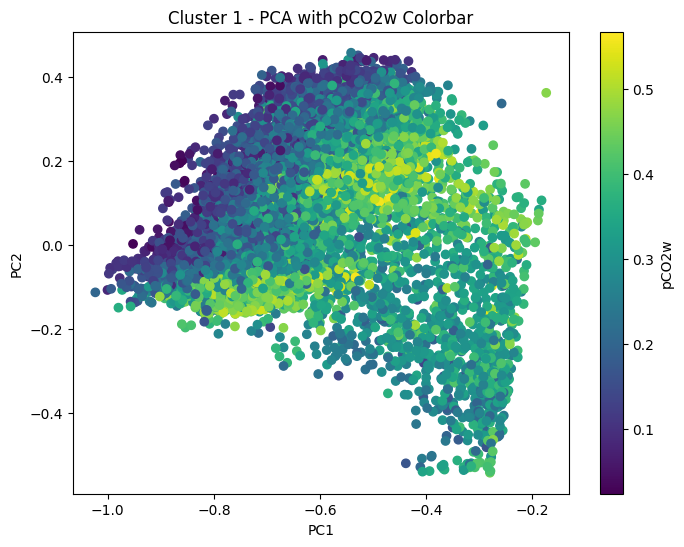

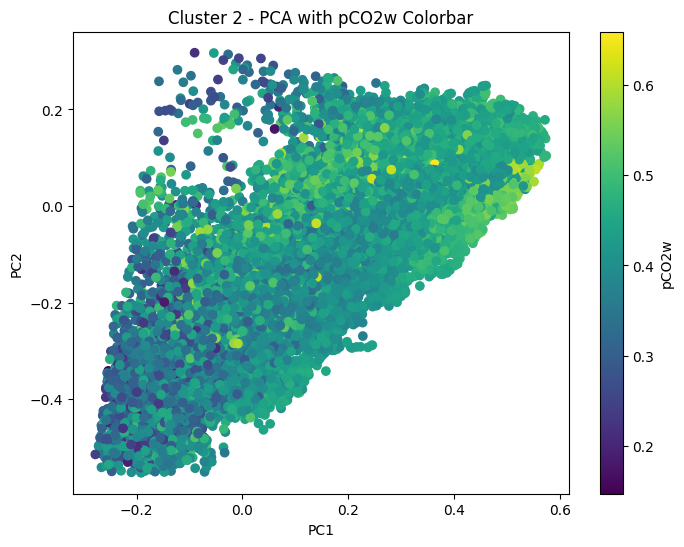

In [80]:
# Number of clusters
n_clusters = len(set(cluster_labels))

# Create separate plots for each cluster
for cluster_id in range(1, n_clusters + 1):
    cluster_data = data_imputed_no_outliers[cluster_labels == cluster_id]
    cluster_pca = pca_result[cluster_labels == cluster_id]

    plt.figure(figsize=(8, 6))

    # Use scatterplot with colorbar for SSS
    scatter = plt.scatter(cluster_pca[:, 0], cluster_pca[:, 1], c=cluster_data['pCO2w'], cmap='viridis')

    plt.title(f"Cluster {cluster_id} - PCA with pCO2w Colorbar")
    plt.xlabel("PC1")
    plt.ylabel("PC2")

    # Add colorbar
    plt.colorbar(scatter, label='pCO2w')

    plt.show()

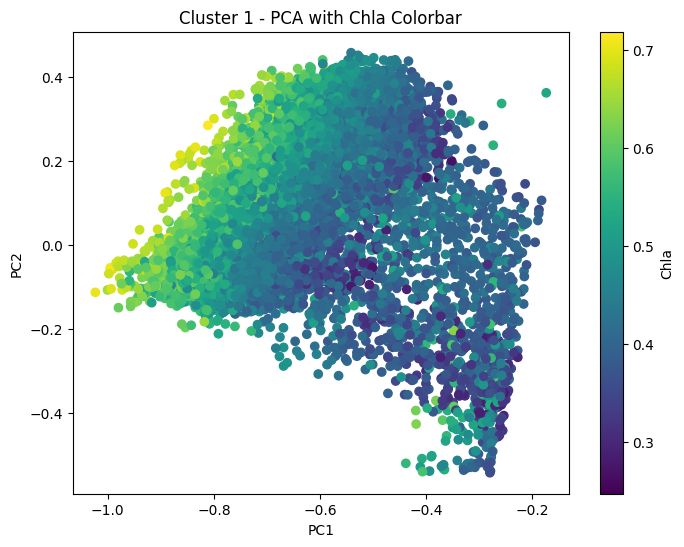

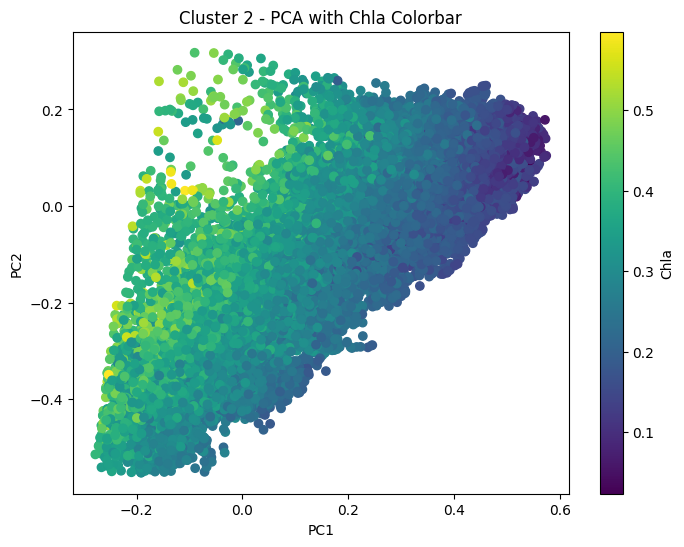

In [81]:
# Number of clusters
n_clusters = len(set(cluster_labels))

# Create separate plots for each cluster
for cluster_id in range(1, n_clusters + 1):
    cluster_data = data_imputed_no_outliers[cluster_labels == cluster_id]
    cluster_pca = pca_result[cluster_labels == cluster_id]

    plt.figure(figsize=(8, 6))

    # Use scatterplot with colorbar for SSS
    scatter = plt.scatter(cluster_pca[:, 0], cluster_pca[:, 1], c=cluster_data['Chla '], cmap='viridis')

    plt.title(f"Cluster {cluster_id} - PCA with Chla Colorbar")
    plt.xlabel("PC1")
    plt.ylabel("PC2")

    # Add colorbar
    plt.colorbar(scatter, label='Chla')

    plt.show()

In [61]:
cluster_data.columns

Index(['pCO2w', 'SST', 'SSS', 'Chla ', 'aCDOM', 'Cluster'], dtype='object')

# Clustering avec SOM

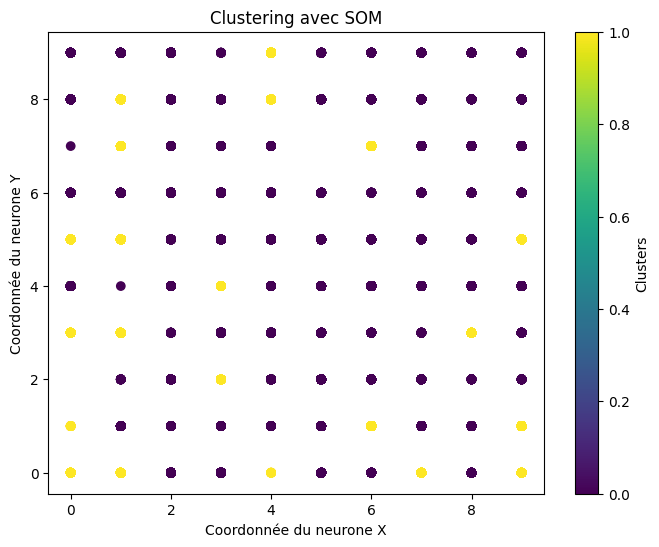

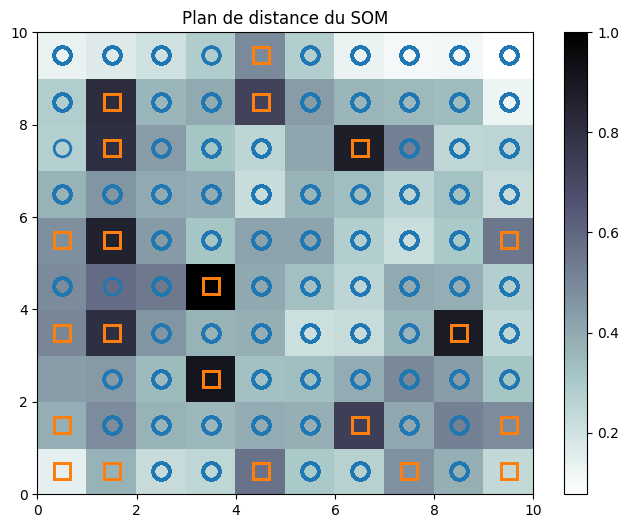

In [82]:
# Installation de minisom (si nécessaire)
!pip install minisom

# Importation des librairies nécessaires
import numpy as np
import matplotlib.pyplot as plt
from minisom import MiniSom



# Normalisation des données (mise à l'échelle entre 0 et 1)
data_values = data_imputed_no_outliers.values  # Utilisation des données sans valeurs aberrantes
data_normalized = (data_values - data_values.min(axis=0)) / (data_values.max(axis=0) - data_values.min(axis=0))

# Paramètres du SOM
map_width = 10  # Largeur de la carte
map_height = 10 # Hauteur de la carte
sigma = 1.0     # Largeur initiale du voisinage
learning_rate = 0.1  # Taux d'apprentissage initial
iterations = 100   # Nombre d'itérations d'apprentissage

# Création du SOM
som = MiniSom(map_width, map_height, data_normalized.shape[1], sigma=sigma, learning_rate=learning_rate)

# Initialisation des poids du SOM
som.random_weights_init(data_normalized)

# Entraînement du SOM
som.train_batch(data_normalized, iterations)

# Visualisation des clusters (affichage des gagnants)
plt.figure(figsize=(8, 6))
winner_coordinates = np.array([som.winner(x) for x in data_normalized])  # Récupérer les coordonnées des gagnants
plt.scatter(winner_coordinates[:, 0], winner_coordinates[:, 1], c=data_imputed_no_outliers['Cluster'], cmap='viridis')  # Utilisation des labels de clustering
plt.title('Clustering avec SOM')
plt.xlabel('Coordonnée du neurone X')
plt.ylabel('Coordonnée du neurone Y')
plt.colorbar(label='Clusters')
plt.show()

# Visualisation de la carte des poids du SOM (facultatif)
plt.figure(figsize=(8,6))
plt.pcolor(som.distance_map().T, cmap='bone_r')  # Visualisation du plan de distance du SOM
plt.colorbar()
plt.title('Plan de distance du SOM')

# Ajout des markers et couleurs selon les clusters
markers = ['o', 's', 'D']  # Marques pour chaque cluster
colors = ['C0', 'C1', 'C2']  # Couleurs pour chaque cluster

# Ajout des données normalisées sur la carte de distance
for cnt, x in enumerate(data_normalized):
    w = som.winner(x)  # Trouver le neurone gagnant
    plt.plot(w[0] + .5, w[1] + .5, markers[data_imputed_no_outliers['Cluster'].iloc[cnt]],
             markerfacecolor='None', markeredgecolor=colors[data_imputed_no_outliers['Cluster'].iloc[cnt]],
             markersize=12, markeredgewidth=2)

plt.show()


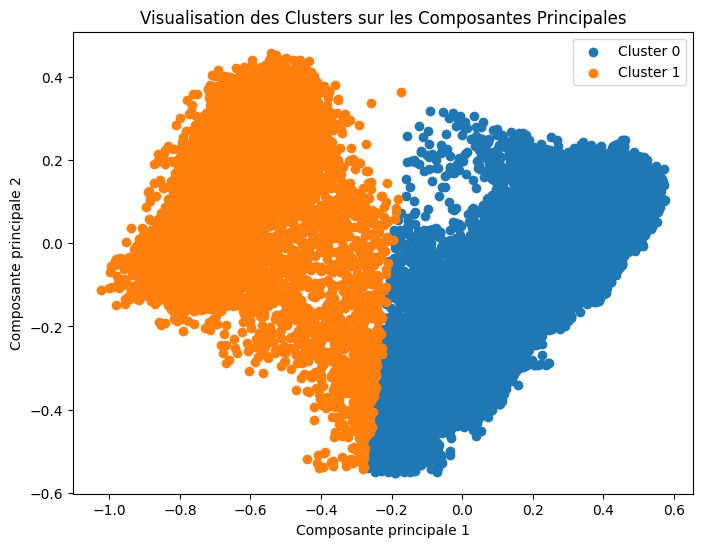

In [85]:
plt.figure(figsize=(8, 6))
for cluster in data_imputed_no_outliers['Cluster'].unique():
    cluster_data = data_imputed_no_outliers[data_imputed_no_outliers['Cluster'] == cluster]
    cluster_pca_result = pca_result[data_imputed_no_outliers['Cluster'] == cluster]
    plt.scatter(cluster_pca_result[:, 0], cluster_pca_result[:, 1], label=f'Cluster {cluster}')

plt.xlabel("Composante principale 1")
plt.ylabel("Composante principale 2")
plt.title("Visualisation des Clusters sur les Composantes Principales")
plt.legend()
plt.show()

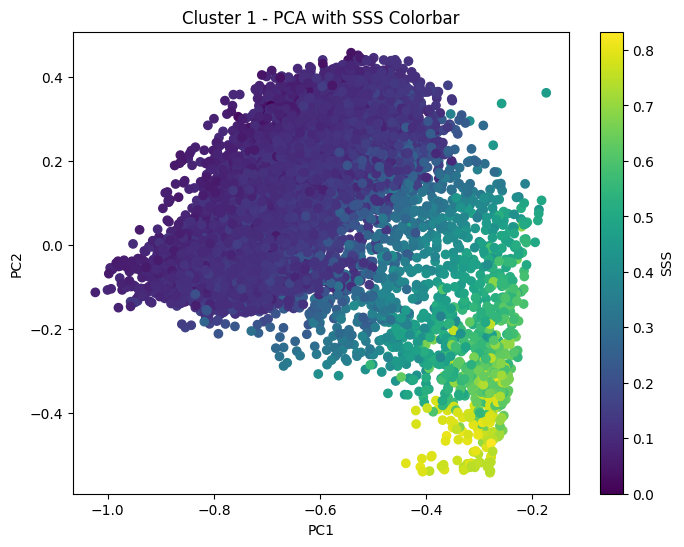

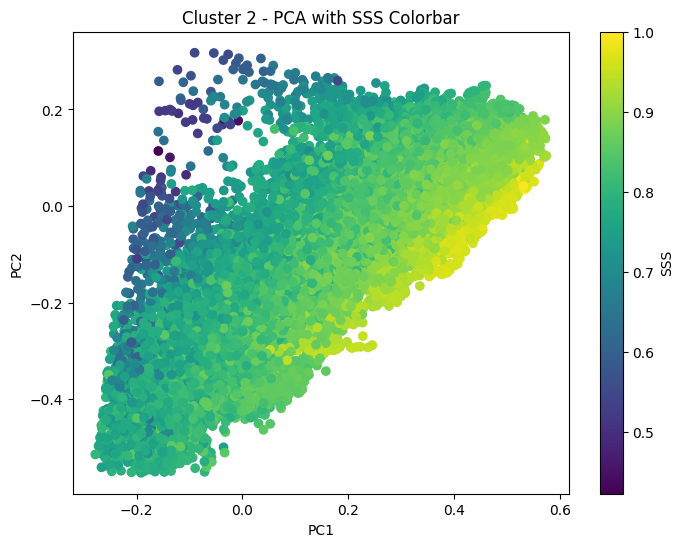

In [83]:
# Number of clusters
n_clusters = len(set(cluster_labels))

# Create separate plots for each cluster
for cluster_id in range(1, n_clusters + 1):
    cluster_data = data_imputed_no_outliers[cluster_labels == cluster_id]
    cluster_pca = pca_result[cluster_labels == cluster_id]

    plt.figure(figsize=(8, 6))

    # Use scatterplot with colorbar for SSS
    scatter = plt.scatter(cluster_pca[:, 0], cluster_pca[:, 1], c=cluster_data['SSS'], cmap='viridis')

    plt.title(f"Cluster {cluster_id} - PCA with SSS Colorbar")
    plt.xlabel("PC1")
    plt.ylabel("PC2")

    # Add colorbar
    plt.colorbar(scatter, label='SSS')

    plt.show()

# Prédictions pCO2w

<ipython-input-67-c8f2906ca4da>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  non_outliers_data['KMeans_Cluster'] = kmeans.fit_predict(X)
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Global Model R-squared: 0.669857751160851
Global Model RMSE: 0.05068623097265851


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Cluster 1 R-squared: 0.5290894091246254
Cluster 1 RMSE: 0.03797070066416745


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Cluster 0 R-squared: 0.4795616578471408
Cluster 0 RMSE: 0.07600201383911422


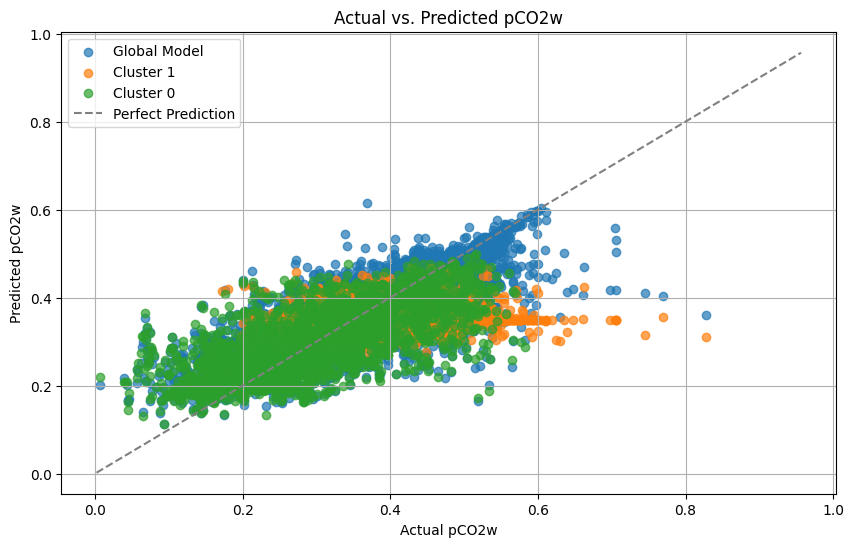

       Model  R-squared      RMSE
0     Global   0.669858  0.050686
1  Cluster 1   0.529089  0.037971
2  Cluster 0   0.479562  0.076002


In [67]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
import matplotlib.pyplot as plt

# Supposons que `non_outliers_data` contient vos données traitées avec 'pCO2w' comme variable cible
X = non_outliers_data.drop('pCO2w', axis=1)
y = non_outliers_data['pCO2w']

# 1. Clustering avec K-means
kmeans = KMeans(n_clusters=2, random_state=42)  # Remplacez 4 par le nombre souhaité de clusters
non_outliers_data['KMeans_Cluster'] = kmeans.fit_predict(X)

# 2. Préparation pour le modèle global
X['KMeans_Cluster'] = non_outliers_data['KMeans_Cluster']
clusters = X['KMeans_Cluster'].unique()

X_train_global = pd.DataFrame()
y_train_global = pd.Series(dtype=float)
X_test_global = pd.DataFrame()
y_test_global = pd.Series(dtype=float)

for cluster in clusters:
    X_cluster = X[X['KMeans_Cluster'] == cluster]
    y_cluster = y[X['KMeans_Cluster'] == cluster]

    X_train_cluster, X_test_cluster, y_train_cluster, y_test_cluster = train_test_split(
        X_cluster.drop('KMeans_Cluster', axis=1), y_cluster, test_size=0.2, random_state=42)

    X_train_global = pd.concat([X_train_global, X_train_cluster])
    y_train_global = pd.concat([y_train_global, y_train_cluster])
    X_test_global = pd.concat([X_test_global, X_test_cluster])
    y_test_global = pd.concat([y_test_global, y_test_cluster])

# Modèle global
rf_global = RandomForestRegressor(n_estimators=100, random_state=42)
rf_global.fit(X_train_global, y_train_global)
y_pred_global = rf_global.predict(X_test_global)
r2_global = r2_score(y_test_global, y_pred_global)
rmse_global = mean_squared_error(y_test_global, y_pred_global, squared=False)

print(f"Global Model R-squared: {r2_global}")
print(f"Global Model RMSE: {rmse_global}")

# 3. Modèles par cluster
r2_per_cluster = {}
rmse_per_cluster = {}

for cluster in clusters:
    X_cluster = X[X['KMeans_Cluster'] == cluster]
    y_cluster = y[X['KMeans_Cluster'] == cluster]

    X_train_cluster, X_test_cluster, y_train_cluster, y_test_cluster = train_test_split(
        X_cluster.drop('KMeans_Cluster', axis=1), y_cluster, test_size=0.2, random_state=42)

    rf_cluster = RandomForestRegressor(n_estimators=100, random_state=42)
    rf_cluster.fit(X_train_cluster, y_train_cluster)
    y_pred_cluster = rf_cluster.predict(X_test_cluster)

    r2_per_cluster[cluster] = r2_score(y_test_cluster, y_pred_cluster)
    rmse_per_cluster[cluster] = mean_squared_error(y_test_cluster, y_pred_cluster, squared=False)

    print(f"Cluster {cluster} R-squared: {r2_per_cluster[cluster]}")
    print(f"Cluster {cluster} RMSE: {rmse_per_cluster[cluster]}")

# 4. Visualisation des résultats
plt.figure(figsize=(10, 6))
plt.scatter(y_test_global, y_pred_global, label='Global Model', alpha=0.7)

for cluster in clusters:
    X_cluster = X[X['KMeans_Cluster'] == cluster]
    y_cluster = y[X['KMeans_Cluster'] == cluster]
    X_train_cluster, X_test_cluster, y_train_cluster, y_test_cluster = train_test_split(
        X_cluster.drop('KMeans_Cluster', axis=1), y_cluster, test_size=0.2, random_state=42)
    y_pred_cluster = rf_cluster.predict(X_test_cluster)
    plt.scatter(y_test_cluster, y_pred_cluster, label=f'Cluster {cluster}', alpha=0.7)

plt.plot([min(y), max(y)], [min(y), max(y)], linestyle='--', color='gray', label='Perfect Prediction')
plt.xlabel('Actual pCO2w')
plt.ylabel('Predicted pCO2w')
plt.title('Actual vs. Predicted pCO2w')
plt.legend()
plt.grid(True)
plt.show()

# Comparaison des résultats
comparison_data = {'Model': ['Global'] + [f'Cluster {c}' for c in clusters],
                   'R-squared': [r2_global] + list(r2_per_cluster.values()),
                   'RMSE': [rmse_global] + list(rmse_per_cluster.values())}
comparison_df = pd.DataFrame(comparison_data)
print(comparison_df)
